<a href="https://colab.research.google.com/github/lwachowiak/Systematic-Analysis-of-Image-Schemas-through-Explainable-Multilingual-Language-Models/blob/main/Image_Schema_Analysis_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
random_split_state=44  #1,2,3,42,44

In [ ]:
!pip install transformers
!pip install lime
!pip install sentencepiece

In [4]:
import pandas as pd
import torch  
import sentencepiece
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler
from torch.utils.data import TensorDataset
from transformers import XLMRobertaTokenizer              #for loading the pretrained model and tokenizer
from transformers import XLMRobertaForSequenceClassification
from transformers import AdamW                            
from transformers import get_linear_schedule_with_warmup
from transformers import TextClassificationPipeline
from transformers import Trainer, TrainingArguments

from sklearn import preprocessing                         #for label encoding
from sklearn.metrics import classification_report         #for showing performance on validation/test sets
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import ParameterGrid         #for grid search
from sklearn.model_selection import ParameterSampler      #for random search
from sklearn.utils.fixes import loguniform
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

import time
import datetime
import random
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline
import seaborn as sns

import lime                                               #for XAI
from lime import lime_text

# Data Exploration

In [6]:
df=pd.read_csv("IS_repository.csv")

In [7]:
df.rename(columns = {'IMAGE_SCHEMA_ANNOTATION':'SuperordinateSchema'}, inplace = True)

**Basic Counts**

Check for and delete duplicates (no duplicates in final csv)

In [8]:
df.drop_duplicates(subset ="LinguisticExamples", 
                     keep = "first", inplace = True) 
df

,SENSORIMOTOR_SOURCE_DOMAIN,TYPE,SuperordinateSchema,SOURCE_DOMAIN_FRAME,"FrameNet (frame), MetaNet (framedata)",TARGET_DOMAIN_FRAME,"FrameNet (frame), MetaNet (framedata).1",CONCEPTUAL_METAPHOR,Language,LinguisticExamples,[SOURCE],TAKEN FROM,COMMENT,Unnamed: 13
0,OBJECT,SPATIAL_PRIMITIVE,OBJECT,Object,frame:Entity,Opportunity,frame:Opportunity,OPPORTUNITIES ARE OBJECTS,en,Seize the opportunity.,"[Lakoff et al., 1991:68]",IScat,checked in MetaNet,NaN
1,OBJECT,SPATIAL_PRIMITIVE,OBJECT,Object,frame:Entity,Opportunity,frame:Opportunity,OPPORTUNITIES ARE OBJECTS,en,Don’t lose this opportunity.,"[Lakoff et al., 1991:68]",IScat,checked in MetaNet,NaN
2,OBJECT,SPATIAL_PRIMITIVE,OBJECT,Object,frame:Entity,Opportunity,frame:Opportunity,OPPORTUNITIES ARE OBJECTS,en,Don’t let the opportunity pass you by.,"[Lakoff et al., 1991:68]",IScat,checked in MetaNet,NaN
3,OBJECT,SPATIAL_PRIMITIVE,OBJECT,Object,frame:Entity,Opportunity,frame:Opportunity,OPPORTUNITIES ARE OBJECTS,en,You have to make your own opportunities.,"[Lakoff et al., 1991:68]",IScat,checked in MetaNet,NaN
4,OBJECT,SPATIAL_PRIMITIVE,OBJECT,Object,frame:Entity,Opportunity,frame:Opportunity,OPPORTUNITIES ARE OBJECTS,en,I’ve had 3 opportunities to meet him.,"[Lakoff et al., 1991:68]",IScat,checked in MetaNet,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2472,SUPPORT,IMAGE_SCHEMA,SUPPORT,Support,framedata:Support,Assistance,framedata:Welfare,GOVERNMENT ASSISTANCE IS SUPPORT,en,We need welfare as a safety net.,MetaNet,MetaNet,NaN,NaN
2473,SUPPORT,IMAGE_SCHEMA,SUPPORT,Support,framedata:Support,Help,frame:Assistance,HELP IS PHYSICAL SUPPORT,en,Our work in the African continent [. . .] is s...,BNC,MetaNet,NaN,NaN
2474,SUPPORT,IMAGE_SCHEMA,SUPPORT,Support,framedata:Support,Help,frame:Assistance,HELP IS PHYSICAL SUPPORT,en,Our conservation program needs your support.,[Grady 1998],MetaNet,NaN,NaN
2475,SUPPORT,IMAGE_SCHEMA,SUPPORT,Support,framedata:Support,Help,frame:Assistance,HELP IS PHYSICAL SUPPORT,en,I've really been leaning on my friends the pas...,[Grady 1998],MetaNet,NaN,NaN


In [9]:
# column used for Image schema labels
df.SuperordinateSchema.value_counts()

CONTAINMENT          605
SOURCE_PATH_GOAL     466
OBJECT               417
VERTICALITY          321
FORCE                299
CENTER-PERIPHERY     136
SUBSTANCE             74
SCALE                 62
PART-WHOLE            30
CONTACT               30
SPLITTING             19
COVERING               7
SUPPORT                7
LINK                   4
Name: SuperordinateSchema, dtype: int64

In [10]:
# how many unique methapors are there per image schema?
df.groupby('SuperordinateSchema')['CONCEPTUAL_METAPHOR'].nunique()

SuperordinateSchema
CENTER-PERIPHERY      28
CONTACT                5
CONTAINMENT           97
COVERING               4
FORCE                 65
LINK                   2
OBJECT               172
PART-WHOLE            10
SCALE                 16
SOURCE_PATH_GOAL      76
SPLITTING              5
SUBSTANCE             13
SUPPORT                3
VERTICALITY           51
Name: CONCEPTUAL_METAPHOR, dtype: int64

**Which words are the top words for each class?**

In [11]:
#prepare count matrix

df_en=df.loc[df['Language'].isin(["en"])]
df_de=df.loc[df['Language'].isin(["de"])]

labels=list(df.SuperordinateSchema.unique())

is_texts_en=[''] * len(labels)
is_texts_de=[''] * len(labels)

#iterrate over dataframe and make one text block for each image schema
for i, row in df_en.iterrows():
  ind=labels.index(row["SuperordinateSchema"])
  is_texts_en[ind]+=row["LinguisticExamples"]

for i, row in df_de.iterrows():
  ind=labels.index(row["SuperordinateSchema"])
  is_texts_de[ind]+=row["LinguisticExamples"]


#create countvectorizer
vectorizer_en = CountVectorizer()
count_matrix_en = vectorizer_en.fit_transform(is_texts_en)
vectorizer_de = CountVectorizer()
count_matrix_de = vectorizer_de.fit_transform(is_texts_de)

In [ ]:
counts_en = pd.DataFrame(count_matrix_en.toarray(),
                  index=labels,
                  columns=vectorizer_en.get_feature_names())

counts_de = pd.DataFrame(count_matrix_de.toarray(),
                  index=labels,
                  columns=vectorizer_de.get_feature_names())

In [13]:
# top words for containment
counts_en.T.sort_values(by="CONTAINMENT",ascending=False).head(10)

,OBJECT,SOURCE_PATH_GOAL,PART-WHOLE,FORCE,SUBSTANCE,CONTAINMENT,CENTER-PERIPHERY,CONTACT,VERTICALITY,LINK,SPLITTING,SCALE,COVERING,SUPPORT
the,268,197,9,136,20,197,58,4,96,0,16,15,8,7
in,52,71,2,41,1,120,12,2,28,0,6,8,0,3
of,127,76,6,65,30,116,21,2,45,1,2,15,4,3
out,13,13,0,7,3,97,4,2,0,0,0,1,0,0
to,122,94,3,68,4,72,37,6,36,0,6,13,4,1
he,38,59,3,24,4,58,14,12,64,0,0,14,0,0
with,24,16,1,8,19,44,7,7,9,0,1,1,0,0
into,13,15,2,17,1,40,1,0,4,0,1,0,0,0
you,36,32,5,7,2,39,11,1,6,0,0,3,0,0
his,26,27,2,14,3,36,5,6,22,0,1,5,1,0


In [14]:
counts_de.T.sort_values(by="CONTAINMENT",ascending=False).head(10)

,OBJECT,SOURCE_PATH_GOAL,PART-WHOLE,FORCE,SUBSTANCE,CONTAINMENT,CENTER-PERIPHERY,CONTACT,VERTICALITY,LINK,SPLITTING,SCALE,COVERING,SUPPORT
in,7,15,0,5,0,64,7,0,5,0,0,1,0,0
der,19,33,0,7,0,35,13,0,19,0,8,3,0,0
die,23,39,0,9,0,25,13,0,27,0,5,2,0,0
aus,2,2,0,1,0,22,1,0,2,0,0,0,0,0
den,7,13,0,6,0,17,4,0,11,0,2,0,0,0
und,5,6,0,1,0,17,3,0,9,0,5,0,0,0
im,4,1,0,3,0,16,0,0,4,0,0,0,0,0
welt,0,1,0,0,0,10,0,0,1,0,0,0,0,0
dem,3,10,0,4,0,10,3,0,4,0,0,0,0,0
sich,3,5,0,2,0,9,5,0,1,0,2,0,0,0


**Which Prep appears with which IS?**

In [15]:
preps_en=['by', 'in', 'on', 'between', 'with', 'over', 'after', 'for', 'at', 'of', 'out',
 'within', 'before', 'until', 'through', 'upon', 'from', 'as', 'under', 'about',
 'up', 'into', 'onto', 'among', 'against', 'that', 'during', 'without',
 'behind', 'towards', 'beyond', 'along', 'like', 'around'
 , 'down', 'because', 'outside', 'off','below','near']

counts_en[preps_en]

,by,in,on,between,with,over,after,for,at,of,...,beyond,along,like,around,down,because,outside,off,below,near
OBJECT,15,52,29,2,24,5,3,28,15,127,...,0,1,2,3,6,1,0,3,0,0
SOURCE_PATH_GOAL,7,71,22,1,16,7,1,19,17,76,...,2,3,2,6,5,1,1,8,0,3
PART-WHOLE,1,2,0,0,1,1,0,3,1,6,...,0,0,0,0,0,0,0,0,0,0
FORCE,14,41,13,2,8,14,0,10,8,65,...,1,3,3,5,0,1,1,5,0,0
SUBSTANCE,0,1,2,0,19,2,0,0,2,30,...,0,0,1,0,0,0,0,1,0,0
CONTAINMENT,5,120,12,0,44,8,3,18,3,116,...,2,0,6,1,1,0,4,6,0,0
CENTER-PERIPHERY,3,12,6,4,7,1,2,6,5,21,...,0,1,3,1,0,1,0,1,0,3
CONTACT,3,2,2,0,7,1,0,1,0,2,...,0,0,0,0,0,0,0,0,0,1
VERTICALITY,0,28,15,0,9,5,2,9,9,45,...,0,0,2,2,12,0,1,2,2,0
LINK,0,0,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


# Prepare Data for Classifier

Only keep classes considered in our analysis

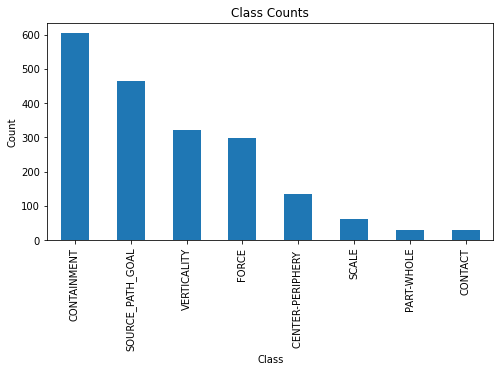

In [16]:
df = df[df.SuperordinateSchema != "LINK"]
df = df[df.SuperordinateSchema != "OBJECT"]
df = df[df.SuperordinateSchema != "SUBSTANCE"]
df = df[df.SuperordinateSchema != "SPLITTING"]
df = df[df.SuperordinateSchema != "SUPPORT"]
df = df[df.SuperordinateSchema != "COVERING"]
df["SuperordinateSchema"].value_counts().plot(kind='bar', title='Class Counts', ylabel="Count", xlabel="Class", figsize=(8,4))

In [17]:
df["SuperordinateSchema"].value_counts()

CONTAINMENT          605
SOURCE_PATH_GOAL     466
VERTICALITY          321
FORCE                299
CENTER-PERIPHERY     136
SCALE                 62
PART-WHOLE            30
CONTACT               30
Name: SuperordinateSchema, dtype: int64

In [18]:
df["Language"].value_counts()

en    1534
de     414
Name: Language, dtype: int64

In [19]:
df["SuperordinateSchema"].loc[df['Language'].isin(["en"])].value_counts()

CONTAINMENT          450
SOURCE_PATH_GOAL     367
FORCE                273
VERTICALITY          236
CENTER-PERIPHERY      96
SCALE                 52
PART-WHOLE            30
CONTACT               30
Name: SuperordinateSchema, dtype: int64

In [20]:
df["SuperordinateSchema"].loc[df['Language'].isin(["de"])].value_counts()

CONTAINMENT          154
SOURCE_PATH_GOAL      99
VERTICALITY           85
CENTER-PERIPHERY      40
FORCE                 26
SCALE                 10
Name: SuperordinateSchema, dtype: int64

Encode labels as numbers 

In [21]:
from sklearn import preprocessing                         #for label encoding

labels=list(df.SuperordinateSchema.unique())
print(labels)

le = preprocessing.LabelEncoder()
le.fit(labels)
df["SuperordinateSchema"]=le.transform(df["SuperordinateSchema"])

labels=le.classes_    #so it has  the same ordering....
print(labels)

['SOURCE_PATH_GOAL', 'PART-WHOLE', 'FORCE', 'CONTAINMENT', 'CENTER-PERIPHERY ', 'CONTACT', 'VERTICALITY', 'SCALE']
['CENTER-PERIPHERY ' 'CONTACT' 'CONTAINMENT' 'FORCE' 'PART-WHOLE' 'SCALE'
 'SOURCE_PATH_GOAL' 'VERTICALITY']


Train Test Split


In [22]:
from sklearn.model_selection import train_test_split

train_data_all, test_data_all, y_train, y_test = train_test_split(df, df["SuperordinateSchema"], stratify=df["SuperordinateSchema"], test_size=0.2, random_state=random_split_state)   #RANDOM STATE SO IT IS ALWAYS THE SAME

In [23]:
print("English Training Samples:", len(train_data_all.loc[train_data_all['Language'].isin(["en"])]))
print("German Training Samples: ", len(train_data_all.loc[train_data_all['Language'].isin(["de"])]))
print("English Test Samples:    ", len(test_data_all.loc[test_data_all['Language'].isin(["en"])]))
print("German Test Samples:     ", len(test_data_all.loc[test_data_all['Language'].isin(["de"])]))

English Training Samples: 1227
German Training Samples:  332
English Test Samples:     307
German Test Samples:      82


In [24]:
# split validation data in german and english
test_data_en=test_data_all.loc[test_data_all['Language'].isin(["en"])]
test_data_de=test_data_all.loc[test_data_all['Language'].isin(["de"])]


Tokenizer

In [25]:
xlmr_tokenizer = XLMRobertaTokenizer.from_pretrained("xlm-roberta-base" )

Downloading:   0%|          | 0.00/4.83M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/615 [00:00<?, ?B/s]

In [26]:
def tokenizer_xlm(data, max_len):
  labels_ = []
  input_ids_ = []
  attn_masks_ = []

  # for each datasample:
  for index, row in data.iterrows():

      sentence = row['LinguisticExamples']

      # create requiered input, i.e. ids and attention masks
      encoded_dict = xlmr_tokenizer.encode_plus(sentence,
                                                max_length=max_len, 
                                                padding='max_length',
                                                truncation=True, 
                                                return_tensors='pt')

      # add encoded sample to lists
      input_ids_.append(encoded_dict['input_ids'])
      attn_masks_.append(encoded_dict['attention_mask'])
      labels_.append(row['SuperordinateSchema'])
      
  # Convert each Python list of Tensors into a 2D Tensor matrix.
  input_ids_ = torch.cat(input_ids_, dim=0)
  attn_masks_ = torch.cat(attn_masks_, dim=0)

  # labels to tensor
  labels_ = torch.tensor(labels_)

  print('Encoder finished. {:,} examples.'.format(len(labels_)))
  return input_ids_, attn_masks_, labels_

In [27]:
#tokenize input for the different training/test sets
max_len=128

input_ids_train, attn_masks_train, labels_all_train = tokenizer_xlm(train_data_all, max_len)
input_ids_test, attn_masks_test, labels_all_test = tokenizer_xlm(test_data_all, max_len)
input_ids_test_de, attn_masks_test_de, labels_test_de = tokenizer_xlm(test_data_de, max_len)
input_ids_test_en, attn_masks_test_en, labels_test_en = tokenizer_xlm(test_data_en, max_len)

Encoder finished. 1,559 examples.
Encoder finished. 390 examples.
Encoder finished. 82 examples.
Encoder finished. 307 examples.


In [28]:
# create datasets
train_dataset = TensorDataset(input_ids_train, attn_masks_train, labels_all_train)
test_dataset = TensorDataset(input_ids_test, attn_masks_test, labels_all_test)
test_dataset_de = TensorDataset(input_ids_test_de, attn_masks_test_de, labels_test_de)
test_dataset_en = TensorDataset(input_ids_test_en, attn_masks_test_en, labels_test_en)

In [29]:
# create dataloaders
batch_size = 16

train_dataloader = DataLoader(train_dataset, sampler = RandomSampler(train_dataset), batch_size = batch_size) #random sampling
test_dataloader = DataLoader(test_dataset, sampler = SequentialSampler(test_dataset),batch_size = batch_size ) #sequential sampling
test_dataloader_de = DataLoader(test_dataset_de, sampler = SequentialSampler(test_dataset_de),batch_size = batch_size ) #sequential sampling
test_dataloader_en = DataLoader(test_dataset_en, sampler = SequentialSampler(test_dataset_en),batch_size = batch_size ) #sequential sampling

# Training

In [30]:
def create_model(lr, eps, train_dataloader, epochs, device):
  print("num labels", len(labels))
  xlmr_model = XLMRobertaForSequenceClassification.from_pretrained("xlm-roberta-base", num_labels=len(labels))
  desc = xlmr_model.to(device)
  print('Connected to GPU:', torch.cuda.get_device_name(0))
  optimizer = AdamW(xlmr_model.parameters(),
                  lr = lr,   
                  eps = eps       
                )
  total_steps = len(train_dataloader) * epochs
  scheduler = get_linear_schedule_with_warmup(optimizer, 
                                            num_warmup_steps = 0,   
                                            num_training_steps = total_steps)
  return xlmr_model, optimizer, scheduler

In [31]:
def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    elapsed_rounded = int(round((elapsed)))
    return str(datetime.timedelta(seconds=elapsed_rounded))  


In [32]:
def validate(validation_dataloader, xlmr_model, verbose, print_cm, normalized=False): 
  
  # put model in evaluation mode 
  xlmr_model.eval()

  # Tracking variables 
  total_eval_loss = 0


  predictions, true_labels = [], []

  # Evaluate data for one epoch
  for batch in validation_dataloader:
          
      # Unpack training batch and copy the tensors to the gpu
      b_input_ids = batch[0].to(device)
      b_input_mask = batch[1].to(device)
      b_labels = batch[2].to(device)
          
      # no backprop needed
      with torch.no_grad():        

          # forward pass
          output =  xlmr_model(b_input_ids, 
                              token_type_ids=None, 
                              attention_mask=b_input_mask,
                              labels=b_labels)
          loss=output.loss
          logits=output.logits
              
      # add up loss
      total_eval_loss += loss.item()

      # on cpu
      logits = logits.detach().cpu().numpy()
      label_ids = b_labels.to('cpu').numpy()

      # save preds/true labels
      predictions.append(logits)
      true_labels.append(label_ids)

  # results of the whole validation set
  flat_predictions = np.concatenate(predictions, axis=0)
  flat_true_labels = np.concatenate(true_labels, axis=0)

  # logit to label
  predicted_labels = np.argmax(flat_predictions, axis=1).flatten()

  # print classification report
  if verbose:
    print(classification_report(flat_true_labels, predicted_labels, labels=list(set(flat_true_labels))))

  # Calculate the validation accuracy, macro f1, and weighted f1
  val_accuracy = (predicted_labels == flat_true_labels).mean()
  macroP, macroR, macroF1, _ = precision_recall_fscore_support(flat_true_labels, predicted_labels, average="macro")#f1_score(flat_true_labels, predicted_labels, average='macro')
  weightedF1 = f1_score(flat_true_labels, predicted_labels, average='weighted')

  # Calculate the average loss over all of the batches.
  avg_val_loss = total_eval_loss / len(validation_dataloader)

  # plot confusion matrix
  if print_cm:
    cm=confusion_matrix(flat_true_labels, predicted_labels, labels=list(range(0, len(labels))))
    if normalized:   
      cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
      cm_normalized=np.round(cm_normalized,2)
      fig, ax = plt.subplots(figsize=(8,6))  
      plt.xlabel("Predicted")
      plt.ylabel("True")
      ax = sns.heatmap(cm_normalized, annot=True, linewidths=.5, xticklabels=labels, yticklabels=labels)
      plt.show()
    else:
      fig, ax = plt.subplots(figsize=(8,6))  
      plt.xlabel("Predicted")
      plt.ylabel("True")
      ax = sns.heatmap(cm, annot=True, fmt="d", linewidths=.5, xticklabels=labels, yticklabels=labels)
      plt.show()

  return avg_val_loss, val_accuracy, macroF1, weightedF1
      

In [33]:
def train_model(epochs, xlmr_model, train_dataloader, validation_dataloader, random_seed, verbose, optimizer, scheduler):

  seed_val = random_seed

  random.seed(seed_val)
  np.random.seed(seed_val)
  torch.manual_seed(seed_val)
  torch.cuda.manual_seed_all(seed_val)

  # mostly contains scores about how the training went for each epoch
  training_stats = []

  # total training time
  total_t0 = time.time()

  print('\033[1m'+"================ Model Training ================"+'\033[0m')

  # For each epoch...
  for epoch_i in range(0, epochs):

      print("")
      print('\033[1m'+'======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs)+'\033[0m')

      t0 = time.time()

      # summed training loss of the epoch
      total_train_loss = 0


      # model is being put into training mode as mechanisms like dropout work differently during train and test time
      xlmr_model.train()

      # iterrate over batches
      for step, batch in enumerate(train_dataloader):

          # unpack training batch at load it to gpu (device)  
          b_input_ids = batch[0].to(device)
          b_input_mask = batch[1].to(device)
          b_labels = batch[2].to(device)

          # clear gradients before calculating new ones
          xlmr_model.zero_grad()        

          # forward pass with current batch

          output=xlmr_model(b_input_ids, 
                              token_type_ids=None, 
                              attention_mask=b_input_mask, 
                              labels=b_labels
                              )
          loss=output.loss
          logits=output.logits

          # add up the loss
          total_train_loss += loss.item()

          # calculate new gradients
          loss.backward()

          # gradient clipping (not bigger than)
          torch.nn.utils.clip_grad_norm_(xlmr_model.parameters(), 1.0)

          # Update the networks weights based on the gradient as well as the optimiziers parameters
          optimizer.step()

          # lr update
          scheduler.step()

      # avg loss over all batches
      avg_train_loss = total_train_loss / len(train_dataloader)            
      
      # training time of this epoch
      training_time = format_time(time.time() - t0)

      print("")
      print("  Average training loss: {0:.2f}".format(avg_train_loss))
      print("  Training epoch took: {:}".format(training_time))
          
  
      # VALIDATION
      print("evaluate")
      if epoch_i==epochs-1:print_cm=True #Print out cm in final iteration
      else: print_cm=False
      avg_val_loss, val_accuracy, macroF1, weightedF1_no_random = validate(validation_dataloader, xlmr_model, verbose, print_cm)   
       

      print('\033[1m'+ "  Validation Loss All: {0:.2f}".format(avg_val_loss) + '\033[0m')

      training_stats.append(
          {
              'epoch': epoch_i + 1,
              'Training Loss': avg_train_loss,
              'Valid. Loss all': avg_val_loss,
              'Valid. Accur.': val_accuracy,
              'Weigh_F1 all': weightedF1_no_random, 
              'Macro F1 all': macroF1,
              'Training Time': training_time,
          }
      )

  print("\n\nTraining complete!")
  print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))
  
  return training_stats


In [34]:
lr=3e-5
eps=1e-8
epochs=12
device = torch.device('cuda')
xlmr_model, optimizer, scheduler = create_model(lr=lr, eps=eps, train_dataloader=train_dataloader, epochs=epochs, device=device)

num labels 8


Downloading:   0%|          | 0.00/1.04G [00:00<?, ?B/s]

Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,


================ Model Training ================

======== Epoch 1 / 12 ========

  Average training loss: 1.76
  Training epoch took: 0:00:24
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.00      0.00      0.00         6
           2       0.55      0.75      0.64       121
           3       0.12      0.02      0.03        60
           4       0.00      0.00      0.00         6
           5       0.00      0.00      0.00        13
           6       0.45      0.86      0.59        93
           7       0.73      0.47      0.57        64

    accuracy                           0.52       390
   macro avg       0.23      0.26      0.23       390
weighted avg       0.42      0.52      0.44       390

  Validation Loss All: 1.49

======== Epoch 2 / 12 ========

  Average training loss: 1.30
  Training epoch took: 0:00:24
evaluate
              precision    recall  f1-score   support

           0       0.62      0.30      0.40        27
           1       0.00      0.00      0.00         6
           2       0.60      0.92      0.72       121
 

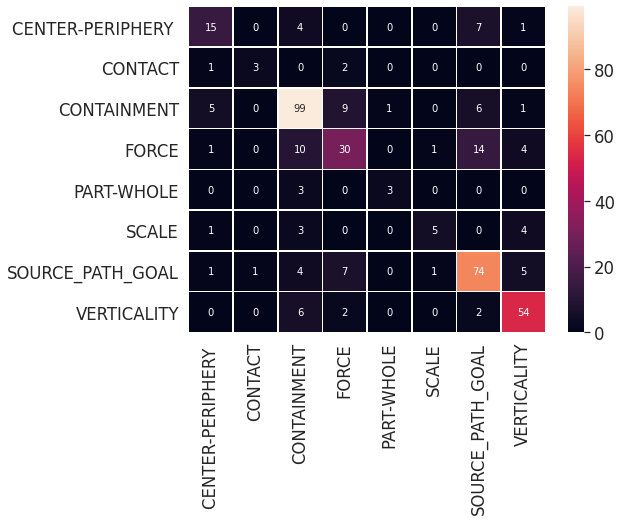

  Validation Loss All: 1.38


Training complete!
Total training took 0:05:01 (h:mm:ss)


In [ ]:
#mit 12 epochs und 3e-5
training_stats=train_model(epochs=epochs,
                           xlmr_model=xlmr_model,
                           train_dataloader=train_dataloader,
                           validation_dataloader=test_dataloader,
                           random_seed=42,
                           verbose=True,
                           optimizer=optimizer,
                           scheduler=scheduler)

In [35]:
# save model
PATH="saved_models/iscat0404_crossval5"
#xlmr_model.save_pretrained(PATH)

In [ ]:
#load
xlmr_model= XLMRobertaForSequenceClassification.from_pretrained(PATH)
device = torch.device('cuda')
xlmr_model.to(device)

# Additional Evaluation

              precision    recall  f1-score   support

           0       0.56      0.48      0.51        21
           1       0.75      0.50      0.60         6
           2       0.74      0.79      0.77        91
           3       0.67      0.53      0.59        55
           4       0.75      0.50      0.60         6
           5       0.71      0.38      0.50        13
           6       0.69      0.80      0.74        71
           7       0.76      0.89      0.82        44

    accuracy                           0.71       307
   macro avg       0.70      0.61      0.64       307
weighted avg       0.71      0.71      0.70       307



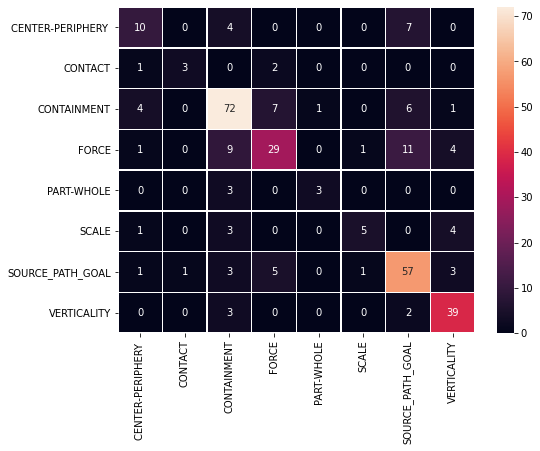

In [ ]:
# validate on english
_,_,_,_=validate(test_dataloader_en, xlmr_model, True, True)

              precision    recall  f1-score   support

           0       0.83      0.83      0.83         6
           2       0.84      0.90      0.87        29
           3       0.14      0.20      0.17         5
           6       0.85      0.77      0.81        22
           7       0.83      0.75      0.79        20

    accuracy                           0.78        82
   macro avg       0.70      0.69      0.69        82
weighted avg       0.80      0.78      0.79        82



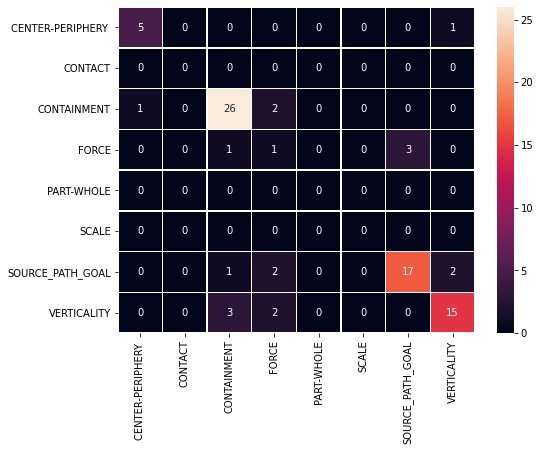

In [ ]:
# validate on german
_,_,_,_=validate(test_dataloader_de, xlmr_model, True, True)

In [ ]:
# Table with training stats
pd.set_option('precision', 2)
df_stats = pd.DataFrame(data=training_stats)
df_stats = df_stats.set_index('epoch')
df_stats

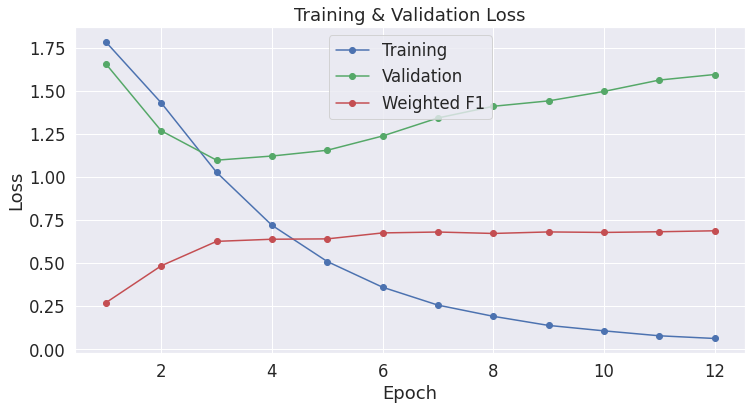

In [ ]:
# Plot Trainingloss, Validation loss and Weighted F1 score for each epoch

sns.set(style='darkgrid')
sns.set(font_scale=1.5)
plt.rcParams["figure.figsize"] = (12,6)
plt.plot(df_stats['Training Loss'], 'b-o', label="Training")
plt.plot(df_stats['Valid. Loss all'], 'g-o', label="Validation")
plt.plot(df_stats['Weigh_F1 all'], 'r-o', label="Weighted F1")
plt.title("Training & Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Lime 

In [ ]:
# returns softmax (from the logits in our case)
def softmax(z):
    assert len(z.shape) == 2
    s = np.max(z, axis=1)
    s = s[:, np.newaxis] # necessary step to do broadcasting
    e_x = np.exp(z - s)
    div = np.sum(e_x, axis=1)
    div = div[:, np.newaxis] # dito
    return e_x / div

#wrapper for our model to work with lime
def pred_for_lime(sentences):
    predictions=np.empty(shape=(len(sentences),len(labels)))    #needs to contain probabilites
    for i, sentence in enumerate(sentences):
        #prepare input and make prediction
        xlmr_model.eval()
        encoded_dict = xlmr_tokenizer.encode_plus(sentence,
                                                max_length=max_len, 
                                                padding='max_length',
                                                truncation=True, 
                                                return_tensors='pt')
        input_id=encoded_dict['input_ids'].to(device)
        attn_mask=encoded_dict['attention_mask'].to(device)
        label=torch.tensor(0).to(device)      
        output =  xlmr_model(input_id, 
                              token_type_ids=None, 
                              attention_mask=attn_mask,
                              labels=label)
        loss=output.loss
        logits=output.logits            
        logits = logits.detach().cpu().numpy()
        prob_preds=softmax(logits)
        #print(sentence)
        #print(prob_preds)
        #print(logits)
        predictions[i]=prob_preds
    return predictions

In [ ]:
explainer = lime_text.LimeTextExplainer(class_names=labels, verbose=False)

# Manually checking confusion pairs 

In [ ]:
def xlmr_predict(model, sentence, label):
        model.eval()
        encoded_dict = xlmr_tokenizer.encode_plus(sentence,
                                                max_length=max_len, 
                                                padding='max_length',
                                                truncation=True, 
                                                return_tensors='pt')
        input_id=encoded_dict['input_ids'].to(device)
        attn_mask=encoded_dict['attention_mask'].to(device)
        label=torch.tensor(0).to(device) 
        #no gradients are computed making everything faster
        with torch.no_grad():                 
          output = model(input_id, 
                                      token_type_ids=None, 
                                      attention_mask=attn_mask,
                                      labels=label)
          logits=output.logits
        logits = logits.detach().cpu().numpy()
        prob_preds=softmax(logits)
        return prob_preds

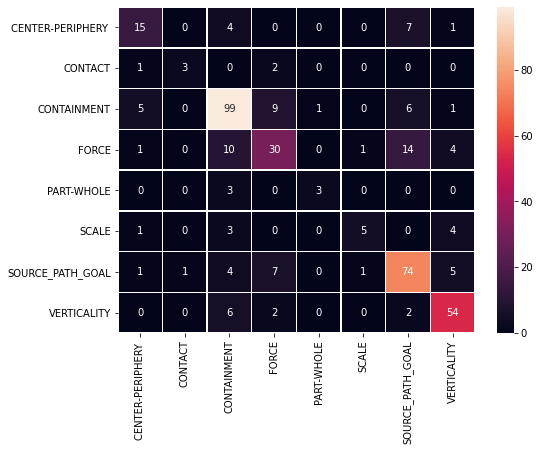

In [ ]:
_,_,_,_=validate(test_dataloader, xlmr_model, False, True, False)

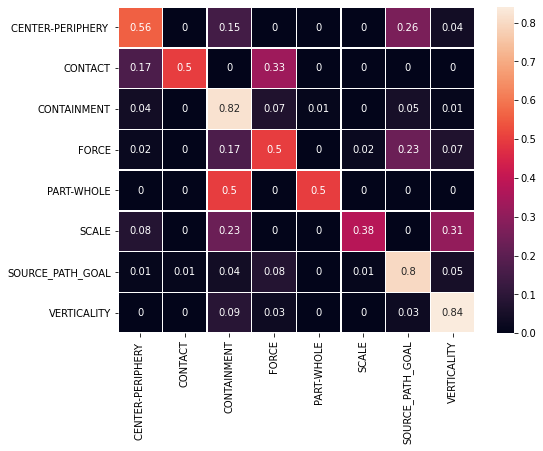

In [ ]:
_,_,_,_=validate(test_dataloader, xlmr_model, False, True,True)

In [ ]:
#SCALE predicted as VERTICALITY
for i, row in test_data_all.iterrows():
  pred = labels[np.argmax(xlmr_predict(xlmr_model, row["LinguisticExamples"], 0)[0])]
  if labels[row["SuperordinateSchema"]]=="SCALE" and pred=="VERTICALITY":
    print(row["LinguisticExamples"], row["SuperordinateSchema"])
    exp = explainer.explain_instance(row["LinguisticExamples"], pred_for_lime, num_features=5, top_labels=7, num_samples=500)
    exp.show_in_notebook()

He’s head and shoulders above everyone in the industry. 5


Maslow is a towering figure in humanistic psychology. 5


The number of available parking spaces continues to shrink.  5


He stands head and shoulders above them. 5


# Global Explanation Stats with LIME

In [ ]:
#global explanation stats over all test samples
len(test_data_en)

307

In [ ]:
#iterrate over test set 

results=[]
for i in labels: results.append({})

for i, row in test_data_en.iterrows():


  
  exp = explainer.explain_instance(row["LinguisticExamples"], pred_for_lime, num_features=20, top_labels=8, num_samples=500)
  #exp.show_in_notebook()

  pred_index=exp.top_labels[0]
  importance_list=exp.as_list(label=pred_index)

  print(row["LinguisticExamples"])
  print(exp.as_list(label=exp.top_labels[0]))

  #save word score of top prediction
  for word,importance in importance_list:
    #word=exp.as_list(label=pred_index)[0][0]
    #importance=exp.as_list(label=pred_index)[0][1]
    if word in results[pred_index]:
      results[pred_index][word].append(importance)
    else:
      results[pred_index][word]=[importance]

print(results)

Keep it in the back of your mind
[('in', 0.4628496635728646), ('back', -0.30389003295222566), ('mind', 0.2690806425731812), ('Keep', -0.15130575645705543), ('your', 0.05016221182463464), ('the', -0.040228328642409585), ('it', -0.028064085292643624), ('of', -0.026260550185017797)]
to have an open marriage
[('marriage', 0.7749973420708612), ('open', -0.18314977286422304), ('an', 0.17893053372163295), ('have', -0.11079241396109613), ('to', -0.07007749206173483)]
He can exert his influence on her.
[('exert', 0.6408823292530543), ('influence', -0.32530898345257636), ('his', 0.2265941127084254), ('her', 0.12875360213575104), ('can', -0.10084338590962527), ('on', -0.0882235623395442), ('He', -0.021367360085923763)]
let anger unroll like a wave
[('wave', 0.8477544003930869), ('like', -0.07644038726279791), ('anger', -0.03000084229412718), ('let', -0.026021094777908097), ('unroll', -0.008083905705140115), ('a', 0.00214649424256636)]
He's really gotten hung up at that step in the process.
[('hun

In [ ]:
results_average=[]
results_amount=[]
for l in results:
  d_avg={}
  d_amount={}
  for word in l:
    average=sum(l[word])/len(l[word])
    amount=len(l[word])
    d_avg[word]=average
    d_amount[word]=amount
  results_average.append(d_avg)
  results_amount.append(d_amount)

In [ ]:
containment_res=sorted(results_average[2].items(), key=lambda item: item[1], reverse=True)[0:10]
containment_res.reverse()
containment_res

[('exert', 0.6408823292530543),
 ('white', 0.7096076630896743),
 ('entered', 0.7139218934834167),
 ('answer', 0.7737432550105798),
 ('diverse', 0.8015245884152528),
 ('broad', 0.8810866127757007),
 ('fullest', 0.8922187422708532),
 ('contain', 0.9070965089967883),
 ('attractive', 0.9174823611983869),
 ('beyond', 0.9579045290119761)]

CENTER-PERIPHERY 
[('approaching', 0.28696355212034436), ('friends', 0.309545406915915), ('further', 0.37745130976212937), ('close', 0.40813866442311514), ('touch', 0.4172598512303376), ('NEXT', 0.5020061480948819), ('closely', 0.701456466050341), ('away', 0.7900864959383957), ('here', 0.8147657470055532), ('closest', 0.819702766907671), ('distant', 0.8670353122627589), ('Here', 0.9095449612000664), ('borderline', 0.9118562586061786), ('remote', 0.9269105875907812), ('borders', 0.946444865982932)]


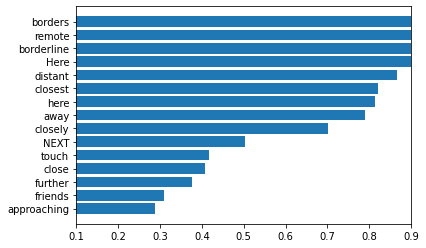

CONTACT
[('got', 0.00857058448462158), ('That', 0.009893025255999723), ('I', 0.01362787495460892), ('made', 0.042851552289332635), ('my', 0.0852939033815681), ('He', 0.08578562053006666), ('an', 0.09397584533122202), ('himself', 0.10957860316615187), ('impression', 0.24730196725625758), ('me', 0.2561124577993028), ('hanging', 0.3118800370131329), ('to', 0.40888326032375966), ('her', 0.41311226994816347), ('fingertips', 0.4988044295007889), ('shields', 0.6091677218038308)]


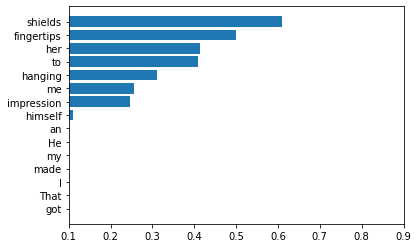

CONTAINMENT
[('pent', 0.5663199429475515), ('handouts', 0.5808858624486323), ('feeding', 0.5817994685009621), ('eating', 0.5903071443348478), ('out', 0.6219004637980837), ('exert', 0.6408823292530543), ('white', 0.7096076630896743), ('entered', 0.7139218934834167), ('answer', 0.7737432550105798), ('diverse', 0.8015245884152528), ('broad', 0.8810866127757007), ('fullest', 0.8922187422708532), ('contain', 0.9070965089967883), ('attractive', 0.9174823611983869), ('beyond', 0.9579045290119761)]


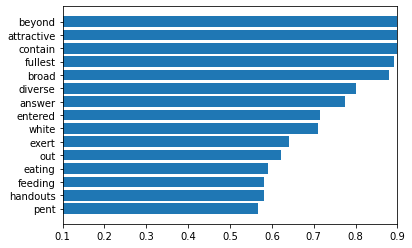

FORCE
[('sour', 0.5947771150605716), ('blew', 0.6539702254536988), ('swept', 0.6808000482125429), ('surges', 0.680950686930108), ('weigh', 0.6854945307034319), ('battered', 0.7200707340738515), ('transported', 0.7278543512582349), ('drew', 0.7463430781865769), ('charged', 0.7535056181365759), ('momentum', 0.7767743893496962), ('struck', 0.7921073827433792), ('wave', 0.8477544003930869), ('blow', 0.8817002700704596), ('crazy', 0.9144258069450453), ('downhill', 0.9155340660590101)]


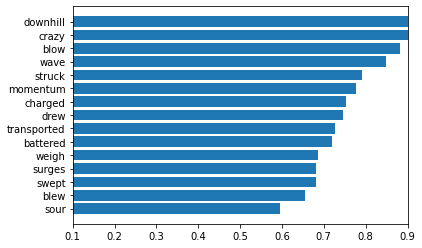

PART-WHOLE
[('That', 0.06651268746559898), ('theory', 0.09264605015041463), ('She', 0.0972217272892066), ('joke', 0.10639875873879676), ('They', 0.10656916283307101), ('my', 0.11835931144141891), ('least', 0.1304153048822182), ('has', 0.1411871699158037), ('splittingly', 0.17983619428036626), ('funny', 0.18732263683019862), ('other', 0.24704967945429193), ('planets', 0.3115489200289823), ('half', 0.5842478271132988), ('side', 0.7609925138436011), ('assembled', 0.817501830704155)]


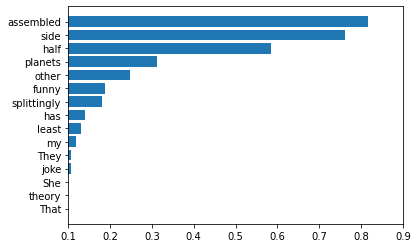

SCALE
[('That', 0.011987084742091193), ('the', 0.014452987222129704), ('s', 0.015222339168724952), ('two', 0.017527141740078477), ('anything', 0.01831603079693797), ('problem', 0.027435452128844157), ('This', 0.030097991938703172), ('conference', 0.032483028970942816), ('He', 0.061737792129120464), ('Let', 0.13983543889424743), ('spread', 0.4944286498364244), ('amount', 0.8664553077806353), ('substantial', 0.8913303096110469), ('big', 0.9271434061040423), ('bigger', 0.9596552242659612)]


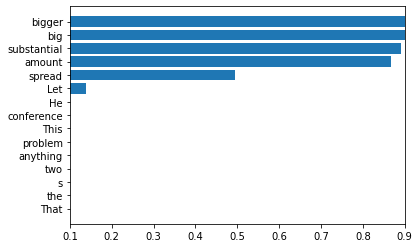

SOURCE_PATH_GOAL
[('gone', 0.5471533651597523), ('invading', 0.5636450463063721), ('forward', 0.5655217355400921), ('love', 0.580717185322827), ('Upcoming', 0.605731973989406), ('marriage', 0.6087928047396316), ('rest', 0.6240569582489186), ('rule', 0.6499697419272028), ('lateral', 0.6639613907506967), ('behind', 0.6919131553916698), ('closer', 0.755469612668107), ('walking', 0.8382773918699439), ('follow', 0.8510045862538291), ('standoffish', 0.8701099141892336), ('track', 0.9452338394237727)]


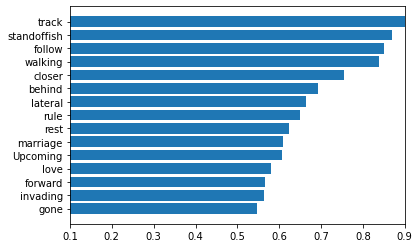

VERTICALITY
[('sinking', 0.642807183308384), ('sliding', 0.6441678918227528), ('heights', 0.6564528256815391), ('subside', 0.6573602182662024), ('up', 0.6848617746820153), ('surface', 0.7037584980677395), ('above', 0.7728342946758249), ('towering', 0.8209513942126073), ('upward', 0.8317371676220006), ('decline', 0.8327787848159631), ('top', 0.8376489571949978), ('shrink', 0.8472293682548567), ('peak', 0.9125179438550679), ('lifted', 0.936886387651109), ('submissive', 0.9442040030544935)]


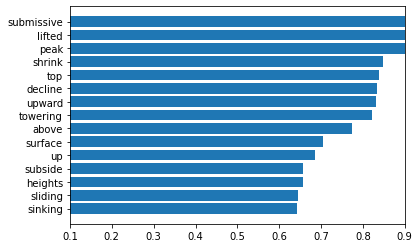

In [ ]:
for i in range(len(labels)):
  print(labels[i])
  res=sorted(results_average[i].items(), key=lambda item: item[1], reverse=True)[0:15]
  res.reverse()
  print(res)
  #plt.rcParams["figure.figsize"] = (10,3)
  #plt.rcParams.update({'font.size': 22})
  plt.barh(range(len(res)), [val[1] for val in res], align='center')
  plt.yticks(range(len(res)), [val[0] for val in res])
  plt.xlim(0.1,0.9)
  #fig = plt.figure()
  plt.show()
  #fig.savefig(labels[i]+'-global-LIME.png', dpi=fig.dpi)

In [ ]:
for i in range(len(labels)):
  print(labels[i])
  res=sorted(results_average[i].items(), key=lambda item: item[1], reverse=True)[0:15]
  res.reverse()
  print(res)
  plt.rcParams["figure.figsize"] = (9,6)
  plt.rcParams.update({'font.size': 22})
  plt.barh(range(len(res)), [val[1] for val in res], align='center')
  plt.yticks(range(len(res)), [val[0] for val in res])
  plt.xlim(0.1,0.9)
  #plt.show()
  plt.savefig(labels[i]+'-global-LIME.png',  bbox_inches = "tight")
  plt.close()
  #fig = plt.figure()
  #
  #fig.savefig(labels[i]+'-global-LIME.png')#, dpi=fig.dpi)

CENTER-PERIPHERY 
[('approaching', 0.28696355212034436), ('friends', 0.309545406915915), ('further', 0.37745130976212937), ('close', 0.40813866442311514), ('touch', 0.4172598512303376), ('NEXT', 0.5020061480948819), ('closely', 0.701456466050341), ('away', 0.7900864959383957), ('here', 0.8147657470055532), ('closest', 0.819702766907671), ('distant', 0.8670353122627589), ('Here', 0.9095449612000664), ('borderline', 0.9118562586061786), ('remote', 0.9269105875907812), ('borders', 0.946444865982932)]
CONTACT
[('got', 0.00857058448462158), ('That', 0.009893025255999723), ('I', 0.01362787495460892), ('made', 0.042851552289332635), ('my', 0.0852939033815681), ('He', 0.08578562053006666), ('an', 0.09397584533122202), ('himself', 0.10957860316615187), ('impression', 0.24730196725625758), ('me', 0.2561124577993028), ('hanging', 0.3118800370131329), ('to', 0.40888326032375966), ('her', 0.41311226994816347), ('fingertips', 0.4988044295007889), ('shields', 0.6091677218038308)]
CONTAINMENT
[('pent'

#Zero-Shot Performance

**Mandarin**

In [ ]:
df_mandarin=pd.read_excel('Mandarin.xlsx')  
df_mandarin["SuperordinateSchema"]=df_mandarin["SuperordinateSchema"].replace("PATH", "SOURCE_PATH_GOAL")
df_mandarin

,SENSORIMOTOR_SOURCE_DOMAIN,TYPE,SuperordinateSchema,TARGET_DOMAIN,CONCEPTUAL_METAPHOR,Language,LinguisticExamples,English,[SOURCE]
0,UP-DOWN,IMAGE_SCHEMA,VERTICALITY,Time,TIME IS A VERTICAL OBJECT,zh,shang yi ge li-bai (上一个礼拜),next week,"[Lai & Boroditsky, 2013]"
1,UP-DOWN,IMAGE_SCHEMA,VERTICALITY,Time,TIME IS A VERTICAL OBJECT,zh,xia yi ge li-bai (下一个礼拜),last week,"[Lai & Boroditsky, 2013]"
2,UP-DOWN,IMAGE_SCHEMA,VERTICALITY,Time,TIME IS A VERTICAL OBJECT,zh,shang yi miao (上一秒),last second,"[Lai & Boroditsky, 2013]"
3,UP-DOWN,IMAGE_SCHEMA,VERTICALITY,Time,TIME IS A VERTICAL OBJECT,zh,xia yi miao (下一秒),next second,"[Lai & Boroditsky, 2013]"
4,UP-DOWN,IMAGE_SCHEMA,VERTICALITY,Time,TIME IS A VERTICAL OBJECT,zh,shang ge yue (上个月),last month,"[Lai & Boroditsky, 2013]"
...,...,...,...,...,...,...,...,...,...
56,NaN,IMAGE_SCHEMA,SOURCE_PATH_GOAL,Thinking,THINKING IS MOVING,zh,"Zhiyao xiang-tong le, ta jiu hui jiji de qu ga...",Once he’s straightened out his thinking [lit.:...,"[Yu, 2003]"
57,NaN,IMAGE_SCHEMA,SOURCE_PATH_GOAL,Thinking,THINKING IS MOVING,zh,Ta xiang-chu yi-tiao miao ji.[she think-out a-...,She thought out (or thought up) a brilliant sc...,"[Yu, 2003]"
58,NaN,IMAGE_SCHEMA,SOURCE_PATH_GOAL,Thinking,THINKING IS A JOURNEY,zh,xiang-lai xiang-qu [think-coming think-going] ...,‘turn over and over in one’s mind,"[Yu, 2003]"
59,NaN,IMAGE_SCHEMA,SOURCE_PATH_GOAL,Thinking,THINKING IS A JOURNEY,zh,zuo-si you-xiang [left-think right-think] 左思右想,think over from different angles; turn somethi...,"[Yu, 2003]"


In [ ]:
df_mandarin.SuperordinateSchema.value_counts()

VERTICALITY         19
CONTAINMENT         18
SOURCE_PATH_GOAL    18
BASIC                6
Name: SuperordinateSchema, dtype: int64

In [ ]:
df_mandarin = df_mandarin[df_mandarin.SuperordinateSchema != "BASIC"]
df_mandarin["SuperordinateSchema"]=le.transform(df_mandarin["SuperordinateSchema"])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
input_ids_test_zh, attn_masks_test_zh, labels_all_test_zh = tokenizer_xlm(df_mandarin, max_len)
test_dataset_zh = TensorDataset(input_ids_test_zh, attn_masks_test_zh, labels_all_test_zh)
test_dataloader_zh = DataLoader(test_dataset_zh, sampler = SequentialSampler(test_dataset_zh),batch_size = batch_size ) #sequential sampling

Encoder finished. 55 examples.


              precision    recall  f1-score   support

           2       0.69      0.50      0.58        18
           6       0.73      0.61      0.67        18
           7       0.93      0.68      0.79        19

   micro avg       0.79      0.60      0.68        55
   macro avg       0.78      0.60      0.68        55
weighted avg       0.79      0.60      0.68        55



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


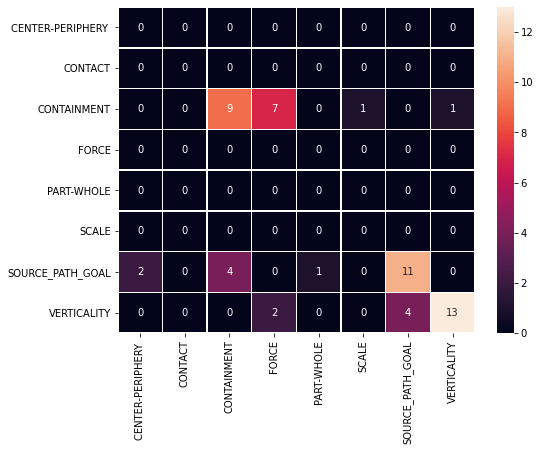

In [ ]:
avg_val_loss, val_accuracy, macroF1, weightedF1=validate(test_dataloader_zh, xlmr_model, True, True)

**Russian**

In [ ]:
df_russian=pd.read_csv('Image Schemas Russian.csv')  

In [ ]:
df_russian = df_russian.rename(columns={'Russian': 'LinguisticExamples', 'ImageSchema': 'SuperordinateSchema'})
df_russian["SuperordinateSchema"]=df_russian["SuperordinateSchema"].replace("PATH", "SOURCE_PATH_GOAL")
df_russian = df_russian[df_russian.SuperordinateSchema != "LINK"]
df_russian = df_russian[df_russian.SuperordinateSchema != "OBJECT"]
df_russian = df_russian[df_russian.SuperordinateSchema != "SUBSTANCE"]
df_russian["SuperordinateSchema"]=le.transform(df_russian["SuperordinateSchema"])
df_russian

,LinguisticExamples,English,SuperordinateSchema,Unnamed: 3,Metaphor,Source,Unnamed: 6,Unnamed: 7,Unnamed: 8
0,"Если какой-то книги нет в продаже, потому что ...",If the book is out of stock just because the c...,2,Resources,RESOURCE IS OUT,https://rus-ltc.org/search,NaN,NaN,NaN
1,GAFA постепенно устраняют конкуренцию на рынк...,GAFA is gradually eliminating competition in t...,0,Importance,IMPORTANT IS NEAR,https://www.vtimes.io/2020/10/30/kak-google-ok...,NaN,NaN,NaN
2,Она идёт в библиотеку.,She is going to the library.,6,NaN,NaN,http://www.russianforeveryone.com/Rufe/Lessons...,NaN,NaN,NaN
3,"Мама, поедем в книжный магазин!","Mom, let's go to the bookstore!",6,NaN,NaN,http://www.russianforeveryone.com/Rufe/Lessons...,NaN,NaN,NaN
4,Подаче иска предшествовал представленный в нач...,The filing of the lawsuit was preceded by a re...,6,NaN,NaN,https://www.vtimes.io/2020/10/30/kak-google-ok...,NaN,NaN,NaN
5,"Wallmart, крупнейшая розничная сеть США,","Wallmart, the largest retailer in the United S...",5,NaN,NaN,https://www.vtimes.io/2020/10/30/krupneishaya-...,NaN,NaN,NaN
6,«Усиление конкуренции после дела Microsoft по...,“Increased competition following the Microsoft...,5,NaN,NaN,https://www.vtimes.io/2020/10/30/kak-google-ok...,NaN,NaN,NaN
8,отложим в сторону проблему социального контрол...,let's put aside the problem of social control ...,0,Importance,UNIMPORTANT ISSUES ARE GIVEN PERIPHERAL POSITIONS,http://lib.ru/POLITOLOG/karamurza.txt (ruTenTe...,NaN,NaN,NaN
9,разных групп пользователей поведение в интерне...,Since different user groups have different beh...,0,Similarity,SIMILARITY IS CLOSENESS,http://www.russianpromo.ru/news/848/ (ruTenTen...,NaN,NaN,NaN
10,"и не было на свете такой силы, которая смогла...",and there was no such force in the world that ...,0,Emotions,AFFECTION IS PHYSICAL CLOSENESS,http://secretofwoman.ru/story.php?page=doroga_...,NaN,NaN,NaN


In [ ]:
input_ids_test_ru, attn_masks_test_ru, labels_all_test_ru = tokenizer_xlm(df_russian, max_len)
test_dataset_ru = TensorDataset(input_ids_test_ru, attn_masks_test_ru, labels_all_test_ru)
test_dataloader_ru = DataLoader(test_dataset_ru, sampler = SequentialSampler(test_dataset_ru),batch_size = batch_size ) #sequential sampling

Encoder finished. 35 examples.


              precision    recall  f1-score   support

           0       0.50      0.20      0.29         5
           1       1.00      0.67      0.80         3
           2       0.60      1.00      0.75         3
           3       0.33      0.33      0.33         3
           4       0.67      0.67      0.67         3
           5       0.67      0.40      0.50         5
           6       0.64      1.00      0.78         7
           7       0.83      0.83      0.83         6

    accuracy                           0.66        35
   macro avg       0.65      0.64      0.62        35
weighted avg       0.66      0.66      0.63        35



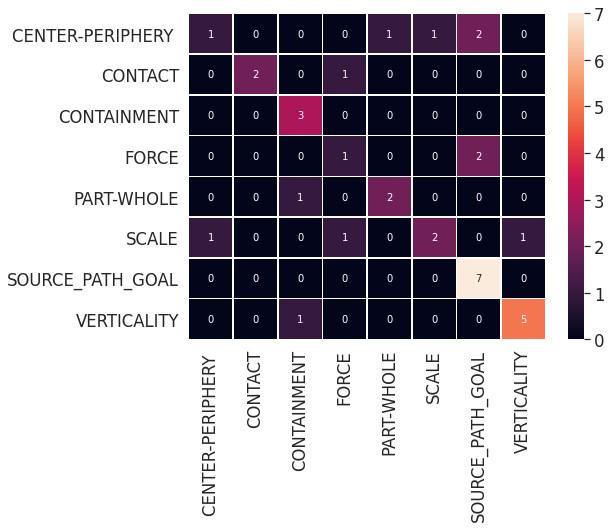

In [ ]:
_,_,_,_=validate(test_dataloader_ru, xlmr_model, True, True)

**French**

In [ ]:
df_french=pd.read_csv('Image Schemas French.csv')  
df_french

,SuperordinateSchema,LinguisticExamples,[SOURCE],Translation,Notes
0,OBJECT,Quelques mois aprés qu'il eut pris sa retraite...,L'autre,Wenige Monate nach seiner Pensionierung starb ...,NaN
1,CENTER-PERIPHERY,Il s'appuyait prés du télephone...,L'autre,Er lehnte neben dem Telephon,NaN
2,CONTAINMENT,Mais il ne pouvait pas se décider à quitter la...,L'autre,Aber er konnt eisch nicht entschließen das Hau...,NaN
3,FORCE,...et comme si le vent poussait son ballon...,L'autre,...und er treibe mit dem Wind...,NaN
4,SCALE,...elle lui montrait combien son plaisir lui f...,L'autre,"...sie hatte ihm gezeigt, dass sie sich über s...",NaN
5,OBJECT,...il prenait de plaisir à sa beauté.,L'autre,...Freude an ihrer Schönheit...,NaN
6,OBJECT,Il se faisait des reproches...,L'autre,Er machte sich Vorwürfe...,NaN
7,PATH,...et parvenir avec lui à une décision.,L'autre,...und ihre Entscheidung finden wollen.,NaN
8,PART-WHOLE,Il reconstituait le souvenir morceau par morec...,L'autre,Er fügte die Erinnerung Stück um Stück zusamme...,NaN
9,CENTER-PERIPHERY,Ils étaient aussi proches l'un de l'autre que ...,L'autre,Sie waren damals so vertraut wie immer,NaN


In [ ]:
df_french = df_french[df_french.SuperordinateSchema != "LINK"]
df_french = df_french[df_french.SuperordinateSchema != "OBJECT"]
df_french = df_french[df_french.SuperordinateSchema != "SUBSTANCE"]
df_french["SuperordinateSchema"]=df_french["SuperordinateSchema"].replace("PATH", "SOURCE_PATH_GOAL")
df_french["SuperordinateSchema"]=le.transform(df_french["SuperordinateSchema"])

In [ ]:
input_ids_test_fr, attn_masks_test_fr, labels_all_test_fr = tokenizer_xlm(df_french, max_len)
test_dataset_fr = TensorDataset(input_ids_test_fr, attn_masks_test_fr, labels_all_test_fr)
test_dataloader_fr = DataLoader(test_dataset_fr, sampler = SequentialSampler(test_dataset_fr),batch_size = batch_size ) #sequential sampling

Encoder finished. 40 examples.


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.50      0.60      0.55         5
           1       1.00      0.40      0.57         5
           2       0.43      1.00      0.60         6
           3       1.00      0.60      0.75         5
           4       0.00      0.00      0.00         3
           5       1.00      0.33      0.50         6
           6       0.38      0.60      0.46         5
           7       1.00      1.00      1.00         5

    accuracy                           0.60        40
   macro avg       0.66      0.57      0.55        40
weighted avg       0.70      0.60      0.58        40



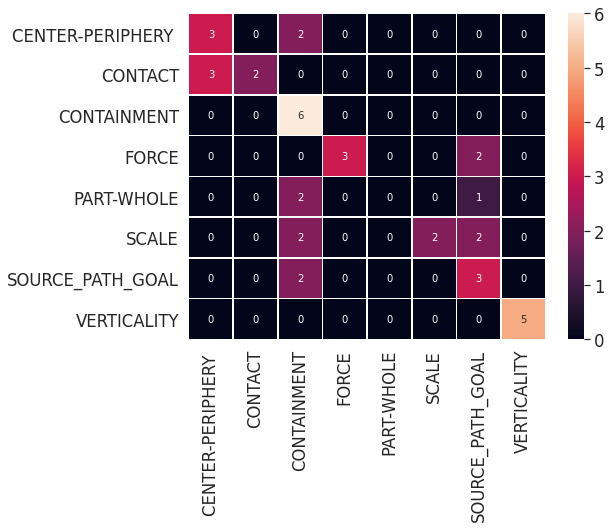

In [ ]:
_,_,_,_=validate(test_dataloader_fr, xlmr_model, True, True)

# Learning Curve

In [37]:
def randomsearch(parameter_list, data_train):
  
  print("Starting Random Search")

  results=[] 

  for i, parameters in enumerate(parameter_list):
    #load parameter
    model_name=parameters["model_name"]
    batch_size=parameters["batch_size"]
    lr=parameters["lr"]
    eps=parameters["eps"]
    max_len=parameters["max_len"]
    epochs=parameters["epochs"]
    warmup_steps=parameters["warmup_steps"]
    random_seed=parameters["random_seed"]

    print("\n"+"\033[1m"+"============== Iteration "+str(i+1)+"/"+str(len(parameter_list))+" =============="+"\033[0m"+"\n")
    print(parameters)

    #prepare input
    xlmr_tokenizer = XLMRobertaTokenizer.from_pretrained(model_name)
    input_ids_train, attn_masks_train, labels_train = tokenizer_xlm(data_train, max_len)
    tensor_data_train = TensorDataset(input_ids_train, attn_masks_train, labels_train)
    train_dataloader = DataLoader(
                tensor_data_train,  
                sampler = RandomSampler(tensor_data_train), 
                batch_size = batch_size 
            )
    #create model
    xlmr_model, optimizer, scheduler = create_model(lr, eps, train_dataloader, epochs, device) 
    #train
    training_stats=train_model(epochs=epochs, 
                           xlmr_model=xlmr_model, 
                           train_dataloader=train_dataloader, 
                           validation_dataloader=test_dataloader,
                           random_seed=i,
                           verbose=False,
                           scheduler=scheduler,
                           optimizer=optimizer)
    
    df_stats = pd.DataFrame(data=training_stats)
    results.append((parameters,
                    training_stats[len(training_stats)-1]["Valid. Loss all"],
                    min(df_stats["Valid. Loss all"]),
                    training_stats[len(training_stats)-1]['Weigh_F1 all']))
  return results

In [38]:
#parameter list for random search
parameter_grid_distr={
    "model_name":["xlm-roberta-base"],
    "lr":[3e-5],
    "eps":[1e-8],
    "max_len":[64], 
    "epochs":[12], 
    "warmup_steps":[0],
    "weight_decay":[0], 
    "batch_size":[16], 
    "random_seed": [1,2,3,4]
    }


param_list = list(ParameterSampler(parameter_grid_distr, n_iter=3))
param_list

[{'batch_size': 16,
  'epochs': 12,
  'eps': 1e-08,
  'lr': 3e-05,
  'max_len': 64,
  'model_name': 'xlm-roberta-base',
  'random_seed': 4,
  'warmup_steps': 0,
  'weight_decay': 0},
 {'batch_size': 16,
  'epochs': 12,
  'eps': 1e-08,
  'lr': 3e-05,
  'max_len': 64,
  'model_name': 'xlm-roberta-base',
  'random_seed': 1,
  'warmup_steps': 0,
  'weight_decay': 0},
 {'batch_size': 16,
  'epochs': 12,
  'eps': 1e-08,
  'lr': 3e-05,
  'max_len': 64,
  'model_name': 'xlm-roberta-base',
  'random_seed': 3,
  'warmup_steps': 0,
  'weight_decay': 0}]

In [ ]:
data_train_90perc=train_data_all.sample(frac=0.9)
data_train_80perc=train_data_all.sample(frac=0.8)
data_train_70perc=train_data_all.sample(frac=0.7)
data_train_60perc=train_data_all.sample(frac=0.6)
data_train_50perc=train_data_all.sample(frac=0.5)
data_train_40perc=train_data_all.sample(frac=0.4)
data_train_30perc=train_data_all.sample(frac=0.3)
data_train_20perc=train_data_all.sample(frac=0.2)
data_train_10perc=train_data_all.sample(frac=0.1)
train_sets=[train_data_all,data_train_90perc,data_train_80perc,data_train_70perc,data_train_60perc,data_train_50perc,data_train_40perc,data_train_30perc,data_train_20perc,data_train_10perc]
data_train_10perc

Length of trainset: 1559
Starting Random Search

============== Iteration 1/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 4, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,559 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.80
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.72

======== Epoch 2 / 12 ========

  Average training loss: 1.69
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.50

======== Epoch 3 / 12 ========

  Average training loss: 1.24
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.17

======== Epoch 4 / 12 ========

  Average training loss: 0.92
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.02

======== Epoch 5 / 12 ========

  Average training loss: 0.62
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.09

======== Epoch 6 / 12 ========

  Average training loss: 0.46
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.14

======== Epoch 7 / 12 ========

  Average training loss: 0.33
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.20

======== Epoch 8 / 12 ========

  Average training loss: 0.23
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.20

======== Epoch 9 / 12 ========

  Average training loss: 0.16
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.33

======== Epoch 10 / 12 ========

  Average training loss: 0.11
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.41

======== Epoch 11 / 12 ========

  Average training loss: 0.10
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.44

======== Epoch 12 / 12 ========

  Average training loss: 0.08
  Training epoch took: 0:00:47
evaluate


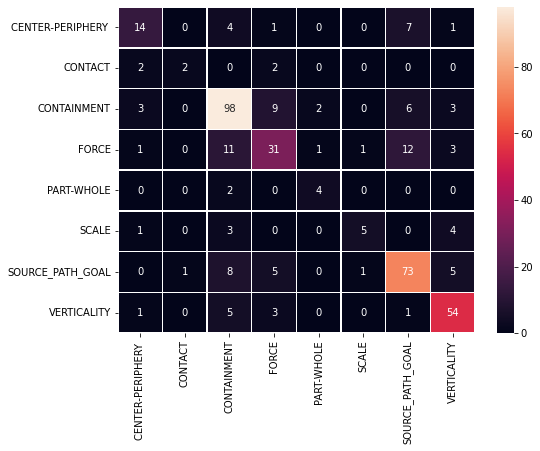

  Validation Loss All: 1.39


Training complete!
Total training took 0:10:27 (h:mm:ss)

============== Iteration 2/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 1, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,559 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.79
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.72

======== Epoch 2 / 12 ========

  Average training loss: 1.56
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.24

======== Epoch 3 / 12 ========

  Average training loss: 1.11
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.09

======== Epoch 4 / 12 ========

  Average training loss: 0.78
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.00

======== Epoch 5 / 12 ========

  Average training loss: 0.59
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.03

======== Epoch 6 / 12 ========

  Average training loss: 0.42
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.15

======== Epoch 7 / 12 ========

  Average training loss: 0.29
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.12

======== Epoch 8 / 12 ========

  Average training loss: 0.19
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.29

======== Epoch 9 / 12 ========

  Average training loss: 0.14
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.26

======== Epoch 10 / 12 ========

  Average training loss: 0.10
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.38

======== Epoch 11 / 12 ========

  Average training loss: 0.07
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.38

======== Epoch 12 / 12 ========

  Average training loss: 0.06
  Training epoch took: 0:00:47
evaluate


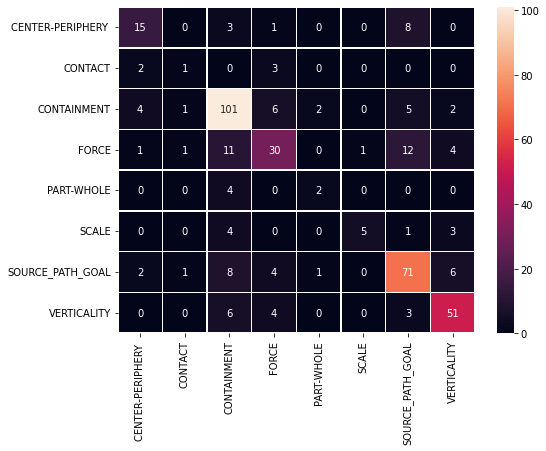

  Validation Loss All: 1.39


Training complete!
Total training took 0:10:28 (h:mm:ss)

============== Iteration 3/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 3, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,559 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.77
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.64

======== Epoch 2 / 12 ========

  Average training loss: 1.40
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.17

======== Epoch 3 / 12 ========

  Average training loss: 1.02
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.08

======== Epoch 4 / 12 ========

  Average training loss: 0.72
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.04

======== Epoch 5 / 12 ========

  Average training loss: 0.50
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.12

======== Epoch 6 / 12 ========

  Average training loss: 0.35
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.16

======== Epoch 7 / 12 ========

  Average training loss: 0.24
  Training epoch took: 0:00:47
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.25

======== Epoch 8 / 12 ========

  Average training loss: 0.17
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.28

======== Epoch 9 / 12 ========

  Average training loss: 0.13
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.31

======== Epoch 10 / 12 ========

  Average training loss: 0.08
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.44

======== Epoch 11 / 12 ========

  Average training loss: 0.05
  Training epoch took: 0:00:47
evaluate
  Validation Loss All: 1.44

======== Epoch 12 / 12 ========

  Average training loss: 0.06
  Training epoch took: 0:00:47
evaluate


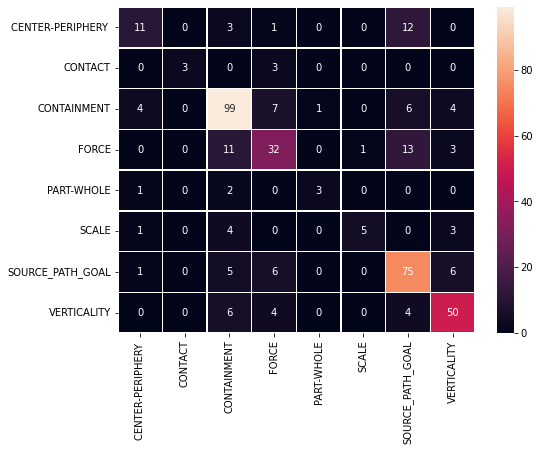

  Validation Loss All: 1.46


Training complete!
Total training took 0:10:28 (h:mm:ss)
max: 0.7133666922164338
Length of trainset: 1403
Starting Random Search

============== Iteration 1/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 4, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,403 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.76
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.56

======== Epoch 2 / 12 ========

  Average training loss: 1.38
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.20

======== Epoch 3 / 12 ========

  Average training loss: 1.01
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.11

======== Epoch 4 / 12 ========

  Average training loss: 0.69
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.12

======== Epoch 5 / 12 ========

  Average training loss: 0.48
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.18

======== Epoch 6 / 12 ========

  Average training loss: 0.33
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.22

======== Epoch 7 / 12 ========

  Average training loss: 0.25
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.29

======== Epoch 8 / 12 ========

  Average training loss: 0.15
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.43

======== Epoch 9 / 12 ========

  Average training loss: 0.13
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.55

======== Epoch 10 / 12 ========

  Average training loss: 0.07
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.60

======== Epoch 11 / 12 ========

  Average training loss: 0.06
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.62

======== Epoch 12 / 12 ========

  Average training loss: 0.04
  Training epoch took: 0:00:42
evaluate


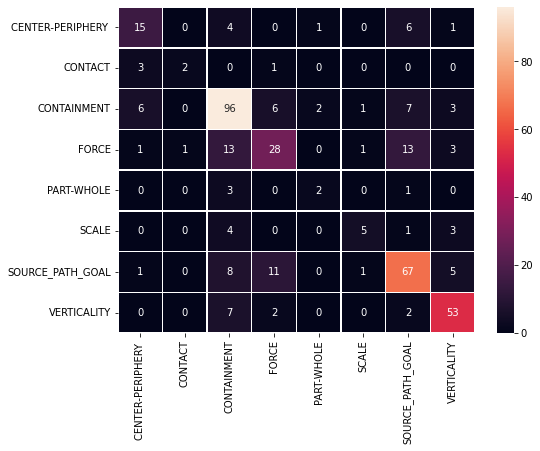

  Validation Loss All: 1.64


Training complete!
Total training took 0:09:31 (h:mm:ss)

============== Iteration 2/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 1, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,403 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.80
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.75

======== Epoch 2 / 12 ========

  Average training loss: 1.68
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.54

======== Epoch 3 / 12 ========

  Average training loss: 1.38
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.23

======== Epoch 4 / 12 ========

  Average training loss: 1.06
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.09

======== Epoch 5 / 12 ========

  Average training loss: 0.79
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.17

======== Epoch 6 / 12 ========

  Average training loss: 0.62
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.13

======== Epoch 7 / 12 ========

  Average training loss: 0.44
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.19

======== Epoch 8 / 12 ========

  Average training loss: 0.32
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.15

======== Epoch 9 / 12 ========

  Average training loss: 0.21
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.31

======== Epoch 10 / 12 ========

  Average training loss: 0.17
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.31

======== Epoch 11 / 12 ========

  Average training loss: 0.12
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.37

======== Epoch 12 / 12 ========

  Average training loss: 0.10
  Training epoch took: 0:00:42
evaluate


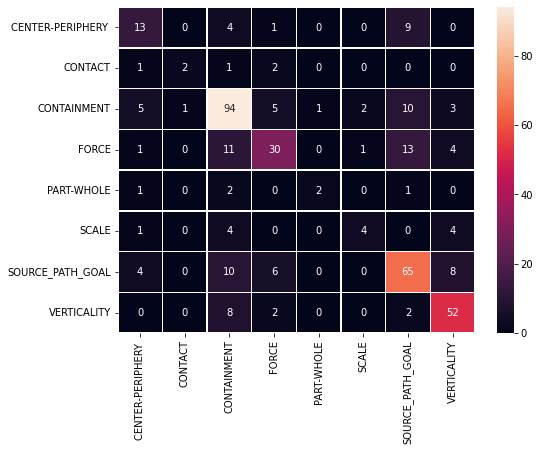

  Validation Loss All: 1.40


Training complete!
Total training took 0:09:28 (h:mm:ss)

============== Iteration 3/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 3, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,403 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.82
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.64

======== Epoch 2 / 12 ========

  Average training loss: 1.46
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.23

======== Epoch 3 / 12 ========

  Average training loss: 1.01
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.13

======== Epoch 4 / 12 ========

  Average training loss: 0.72
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.15

======== Epoch 5 / 12 ========

  Average training loss: 0.50
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.11

======== Epoch 6 / 12 ========

  Average training loss: 0.34
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.22

======== Epoch 7 / 12 ========

  Average training loss: 0.24
  Training epoch took: 0:00:42
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.33

======== Epoch 8 / 12 ========

  Average training loss: 0.16
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.38

======== Epoch 9 / 12 ========

  Average training loss: 0.13
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.48

======== Epoch 10 / 12 ========

  Average training loss: 0.10
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.53

======== Epoch 11 / 12 ========

  Average training loss: 0.06
  Training epoch took: 0:00:42
evaluate
  Validation Loss All: 1.57

======== Epoch 12 / 12 ========

  Average training loss: 0.06
  Training epoch took: 0:00:42
evaluate


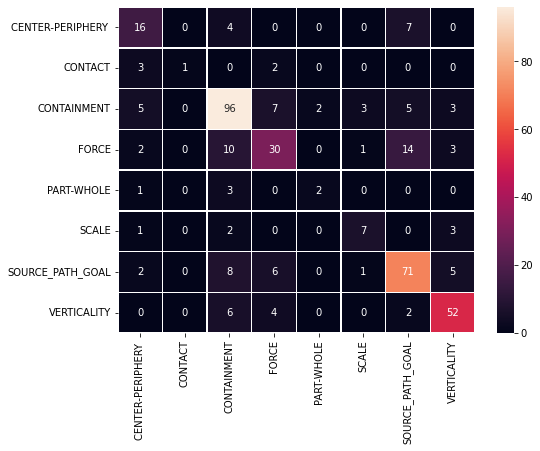

  Validation Loss All: 1.59


Training complete!
Total training took 0:09:29 (h:mm:ss)
max: 0.6986896240689938
Length of trainset: 1247
Starting Random Search

============== Iteration 1/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 4, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,247 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.80
  Training epoch took: 0:00:38
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.68

======== Epoch 2 / 12 ========

  Average training loss: 1.47
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.40

======== Epoch 3 / 12 ========

  Average training loss: 1.07
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.17

======== Epoch 4 / 12 ========

  Average training loss: 0.77
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.12

======== Epoch 5 / 12 ========

  Average training loss: 0.54
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.08

======== Epoch 6 / 12 ========

  Average training loss: 0.36
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.12

======== Epoch 7 / 12 ========

  Average training loss: 0.25
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.23

======== Epoch 8 / 12 ========

  Average training loss: 0.16
  Training epoch took: 0:00:37
evaluate
  Validation Loss All: 1.31

======== Epoch 9 / 12 ========

  Average training loss: 0.12
  Training epoch took: 0:00:37
evaluate
  Validation Loss All: 1.42

======== Epoch 10 / 12 ========

  Average training loss: 0.09
  Training epoch took: 0:00:37
evaluate
  Validation Loss All: 1.46

======== Epoch 11 / 12 ========

  Average training loss: 0.05
  Training epoch took: 0:00:37
evaluate
  Validation Loss All: 1.50

======== Epoch 12 / 12 ========

  Average training loss: 0.05
  Training epoch took: 0:00:37
evaluate


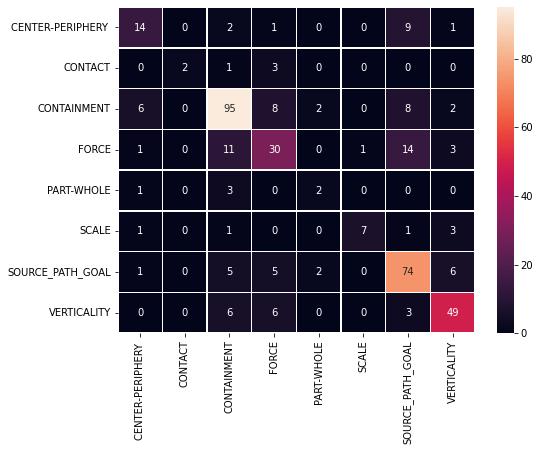

  Validation Loss All: 1.51


Training complete!
Total training took 0:08:36 (h:mm:ss)

============== Iteration 2/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 1, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,247 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.85
  Training epoch took: 0:00:38
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.79

======== Epoch 2 / 12 ========

  Average training loss: 1.75
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.76

======== Epoch 3 / 12 ========

  Average training loss: 1.73
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 4 / 12 ========

  Average training loss: 1.73
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.72

======== Epoch 5 / 12 ========

  Average training loss: 1.72
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.74

======== Epoch 6 / 12 ========

  Average training loss: 1.72
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.70

======== Epoch 7 / 12 ========

  Average training loss: 1.71
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.68

======== Epoch 8 / 12 ========

  Average training loss: 1.64
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.56

======== Epoch 9 / 12 ========

  Average training loss: 1.41
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.33

======== Epoch 10 / 12 ========

  Average training loss: 1.17
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.25

======== Epoch 11 / 12 ========

  Average training loss: 1.05
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.18

======== Epoch 12 / 12 ========

  Average training loss: 0.97
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


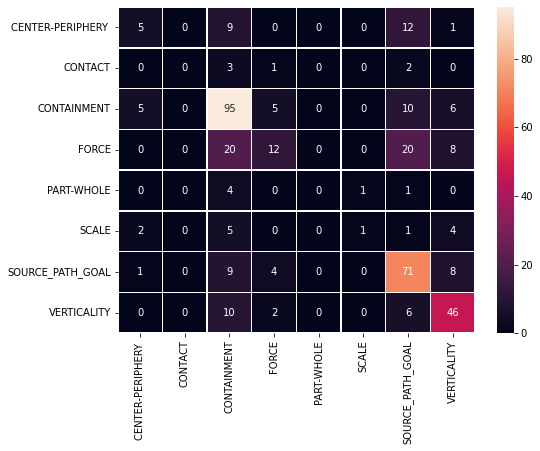

  Validation Loss All: 1.17


Training complete!
Total training took 0:08:36 (h:mm:ss)

============== Iteration 3/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 3, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,247 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.82
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.70

======== Epoch 2 / 12 ========

  Average training loss: 1.70
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.53

======== Epoch 3 / 12 ========

  Average training loss: 1.35
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.23

======== Epoch 4 / 12 ========

  Average training loss: 1.03
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.13

======== Epoch 5 / 12 ========

  Average training loss: 0.73
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.12

======== Epoch 6 / 12 ========

  Average training loss: 0.51
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.14

======== Epoch 7 / 12 ========

  Average training loss: 0.39
  Training epoch took: 0:00:37
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.15

======== Epoch 8 / 12 ========

  Average training loss: 0.27
  Training epoch took: 0:00:37
evaluate
  Validation Loss All: 1.23

======== Epoch 9 / 12 ========

  Average training loss: 0.20
  Training epoch took: 0:00:37
evaluate
  Validation Loss All: 1.28

======== Epoch 10 / 12 ========

  Average training loss: 0.16
  Training epoch took: 0:00:37
evaluate
  Validation Loss All: 1.33

======== Epoch 11 / 12 ========

  Average training loss: 0.12
  Training epoch took: 0:00:37
evaluate
  Validation Loss All: 1.36

======== Epoch 12 / 12 ========

  Average training loss: 0.10
  Training epoch took: 0:00:37
evaluate


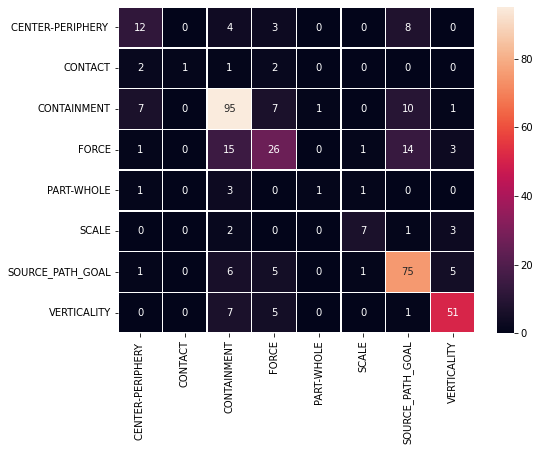

  Validation Loss All: 1.39


Training complete!
Total training took 0:08:33 (h:mm:ss)
max: 0.6957024402906182
Length of trainset: 1091
Starting Random Search

============== Iteration 1/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 4, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,091 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.83
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 2 / 12 ========

  Average training loss: 1.73
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.68

======== Epoch 3 / 12 ========

  Average training loss: 1.64
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.38

======== Epoch 4 / 12 ========

  Average training loss: 1.26
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.17

======== Epoch 5 / 12 ========

  Average training loss: 0.94
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.10

======== Epoch 6 / 12 ========

  Average training loss: 0.67
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.16

======== Epoch 7 / 12 ========

  Average training loss: 0.51
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.11

======== Epoch 8 / 12 ========

  Average training loss: 0.37
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.19

======== Epoch 9 / 12 ========

  Average training loss: 0.25
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.34

======== Epoch 10 / 12 ========

  Average training loss: 0.21
  Training epoch took: 0:00:33
evaluate
  Validation Loss All: 1.31

======== Epoch 11 / 12 ========

  Average training loss: 0.15
  Training epoch took: 0:00:33
evaluate
  Validation Loss All: 1.34

======== Epoch 12 / 12 ========

  Average training loss: 0.13
  Training epoch took: 0:00:33
evaluate


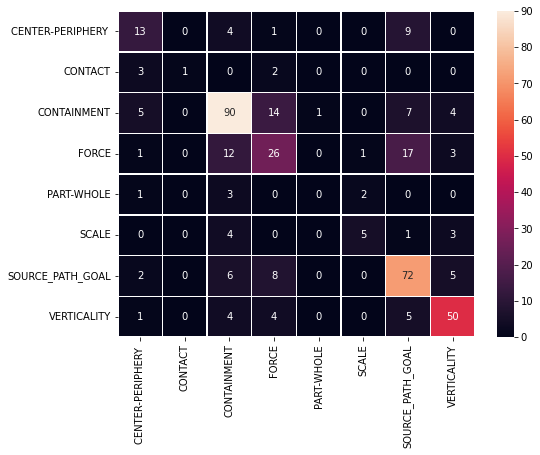

  Validation Loss All: 1.36


Training complete!
Total training took 0:07:40 (h:mm:ss)

============== Iteration 2/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 1, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,091 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.82
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.66

======== Epoch 2 / 12 ========

  Average training loss: 1.53
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.29

======== Epoch 3 / 12 ========

  Average training loss: 1.17
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.14

======== Epoch 4 / 12 ========

  Average training loss: 0.89
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.06

======== Epoch 5 / 12 ========

  Average training loss: 0.64
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.07

======== Epoch 6 / 12 ========

  Average training loss: 0.44
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.11

======== Epoch 7 / 12 ========

  Average training loss: 0.33
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.20

======== Epoch 8 / 12 ========

  Average training loss: 0.23
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.26

======== Epoch 9 / 12 ========

  Average training loss: 0.18
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.30

======== Epoch 10 / 12 ========

  Average training loss: 0.15
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.36

======== Epoch 11 / 12 ========

  Average training loss: 0.11
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.36

======== Epoch 12 / 12 ========

  Average training loss: 0.10
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


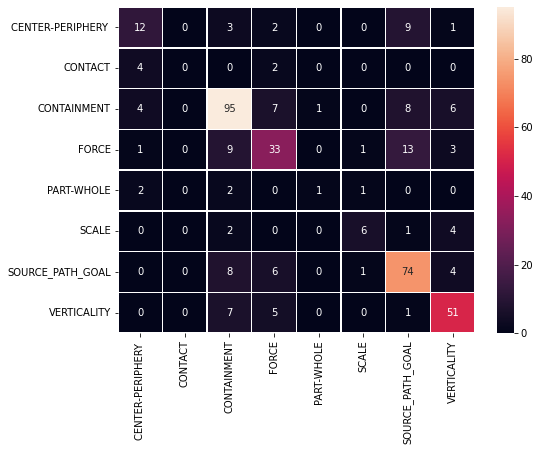

  Validation Loss All: 1.37


Training complete!
Total training took 0:07:41 (h:mm:ss)

============== Iteration 3/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 3, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 1,091 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.83
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.71

======== Epoch 2 / 12 ========

  Average training loss: 1.64
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.38

======== Epoch 3 / 12 ========

  Average training loss: 1.30
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.19

======== Epoch 4 / 12 ========

  Average training loss: 0.95
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.15

======== Epoch 5 / 12 ========

  Average training loss: 0.73
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.15

======== Epoch 6 / 12 ========

  Average training loss: 0.51
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.09

======== Epoch 7 / 12 ========

  Average training loss: 0.38
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.20

======== Epoch 8 / 12 ========

  Average training loss: 0.27
  Training epoch took: 0:00:33
evaluate
  Validation Loss All: 1.22

======== Epoch 9 / 12 ========

  Average training loss: 0.19
  Training epoch took: 0:00:33
evaluate
  Validation Loss All: 1.34

======== Epoch 10 / 12 ========

  Average training loss: 0.14
  Training epoch took: 0:00:33
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.38

======== Epoch 11 / 12 ========

  Average training loss: 0.12
  Training epoch took: 0:00:33
evaluate
  Validation Loss All: 1.43

======== Epoch 12 / 12 ========

  Average training loss: 0.11
  Training epoch took: 0:00:33
evaluate


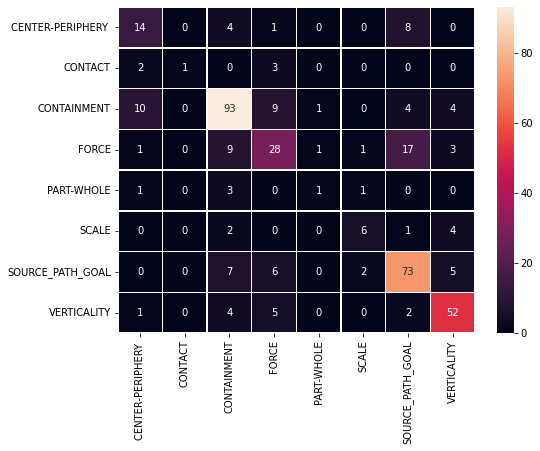

  Validation Loss All: 1.44


Training complete!
Total training took 0:07:41 (h:mm:ss)
max: 0.6854132068953174
Length of trainset: 935
Starting Random Search

============== Iteration 1/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 4, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 935 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.81
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.70

======== Epoch 2 / 12 ========

  Average training loss: 1.55
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.38

======== Epoch 3 / 12 ========

  Average training loss: 1.17
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.22

======== Epoch 4 / 12 ========

  Average training loss: 0.91
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.15

======== Epoch 5 / 12 ========

  Average training loss: 0.67
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.27

======== Epoch 6 / 12 ========

  Average training loss: 0.46
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.19

======== Epoch 7 / 12 ========

  Average training loss: 0.32
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.29

======== Epoch 8 / 12 ========

  Average training loss: 0.22
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.39

======== Epoch 9 / 12 ========

  Average training loss: 0.16
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.46

======== Epoch 10 / 12 ========

  Average training loss: 0.13
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.56

======== Epoch 11 / 12 ========

  Average training loss: 0.11
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.51

======== Epoch 12 / 12 ========

  Average training loss: 0.09
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


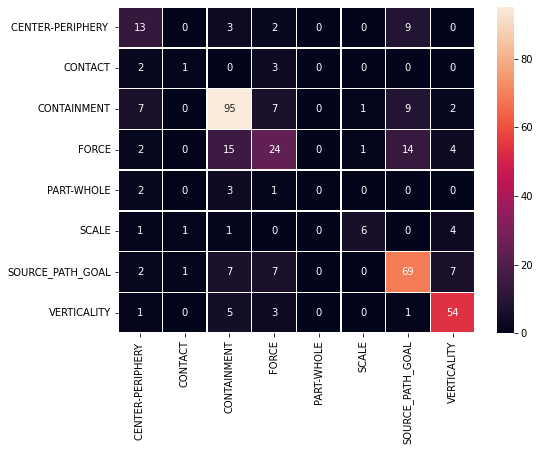

  Validation Loss All: 1.53


Training complete!
Total training took 0:06:44 (h:mm:ss)

============== Iteration 2/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 1, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 935 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.80
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.80

======== Epoch 2 / 12 ========

  Average training loss: 1.70
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.58

======== Epoch 3 / 12 ========

  Average training loss: 1.39
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.29

======== Epoch 4 / 12 ========

  Average training loss: 1.10
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.21

======== Epoch 5 / 12 ========

  Average training loss: 0.84
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.26

======== Epoch 6 / 12 ========

  Average training loss: 0.61
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.17

======== Epoch 7 / 12 ========

  Average training loss: 0.43
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.23

======== Epoch 8 / 12 ========

  Average training loss: 0.33
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.36

======== Epoch 9 / 12 ========

  Average training loss: 0.25
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.39

======== Epoch 10 / 12 ========

  Average training loss: 0.18
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.43

======== Epoch 11 / 12 ========

  Average training loss: 0.15
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.44

======== Epoch 12 / 12 ========

  Average training loss: 0.14
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


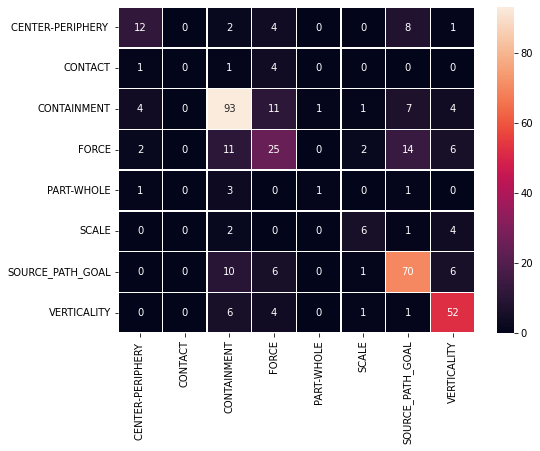

  Validation Loss All: 1.47


Training complete!
Total training took 0:06:44 (h:mm:ss)

============== Iteration 3/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 3, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 935 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.79
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.70

======== Epoch 2 / 12 ========

  Average training loss: 1.66
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.52

======== Epoch 3 / 12 ========

  Average training loss: 1.33
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.27

======== Epoch 4 / 12 ========

  Average training loss: 1.01
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.19

======== Epoch 5 / 12 ========

  Average training loss: 0.77
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.20

======== Epoch 6 / 12 ========

  Average training loss: 0.57
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.25

======== Epoch 7 / 12 ========

  Average training loss: 0.41
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.27

======== Epoch 8 / 12 ========

  Average training loss: 0.30
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.27

======== Epoch 9 / 12 ========

  Average training loss: 0.22
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.34

======== Epoch 10 / 12 ========

  Average training loss: 0.17
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.41

======== Epoch 11 / 12 ========

  Average training loss: 0.14
  Training epoch took: 0:00:28
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.45

======== Epoch 12 / 12 ========

  Average training loss: 0.12
  Training epoch took: 0:00:28
evaluate


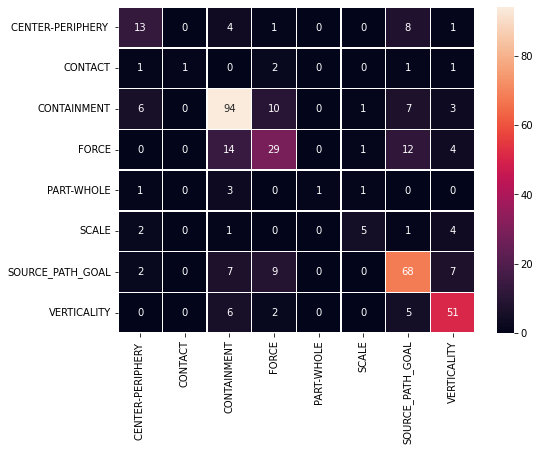

  Validation Loss All: 1.44


Training complete!
Total training took 0:06:44 (h:mm:ss)
max: 0.661857953367007
Length of trainset: 780
Starting Random Search

============== Iteration 1/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 4, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 780 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.85
  Training epoch took: 0:00:24
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.71

======== Epoch 2 / 12 ========

  Average training loss: 1.66
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.48

======== Epoch 3 / 12 ========

  Average training loss: 1.34
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.26

======== Epoch 4 / 12 ========

  Average training loss: 1.02
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.19

======== Epoch 5 / 12 ========

  Average training loss: 0.77
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.25

======== Epoch 6 / 12 ========

  Average training loss: 0.57
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.33

======== Epoch 7 / 12 ========

  Average training loss: 0.43
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.31

======== Epoch 8 / 12 ========

  Average training loss: 0.31
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.33

======== Epoch 9 / 12 ========

  Average training loss: 0.24
  Training epoch took: 0:00:23
evaluate
  Validation Loss All: 1.36

======== Epoch 10 / 12 ========

  Average training loss: 0.17
  Training epoch took: 0:00:23
evaluate
  Validation Loss All: 1.43

======== Epoch 11 / 12 ========

  Average training loss: 0.14
  Training epoch took: 0:00:23
evaluate
  Validation Loss All: 1.47

======== Epoch 12 / 12 ========

  Average training loss: 0.12
  Training epoch took: 0:00:23
evaluate


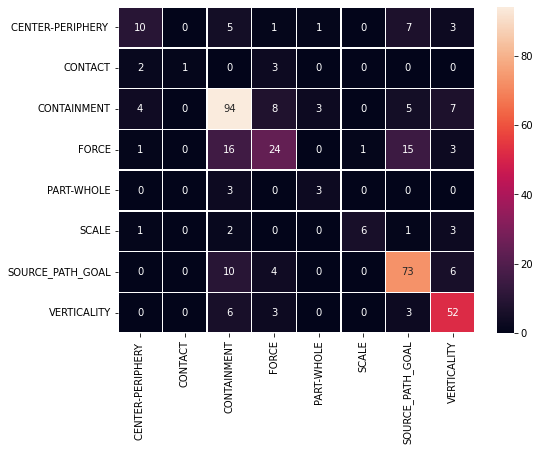

  Validation Loss All: 1.45


Training complete!
Total training took 0:05:47 (h:mm:ss)

============== Iteration 2/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 1, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 780 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.87
  Training epoch took: 0:00:24
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.71

======== Epoch 2 / 12 ========

  Average training loss: 1.77
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.72

======== Epoch 3 / 12 ========

  Average training loss: 1.70
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.57

======== Epoch 4 / 12 ========

  Average training loss: 1.39
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.22

======== Epoch 5 / 12 ========

  Average training loss: 1.01
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.15

======== Epoch 6 / 12 ========

  Average training loss: 0.78
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.14

======== Epoch 7 / 12 ========

  Average training loss: 0.60
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.17

======== Epoch 8 / 12 ========

  Average training loss: 0.44
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.19

======== Epoch 9 / 12 ========

  Average training loss: 0.34
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.25

======== Epoch 10 / 12 ========

  Average training loss: 0.29
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.31

======== Epoch 11 / 12 ========

  Average training loss: 0.23
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.34

======== Epoch 12 / 12 ========

  Average training loss: 0.21
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


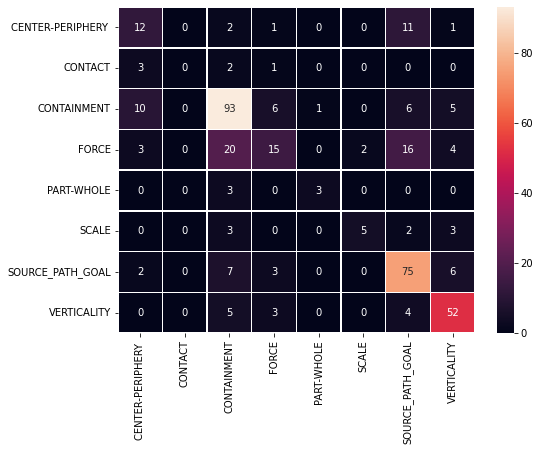

  Validation Loss All: 1.33


Training complete!
Total training took 0:05:48 (h:mm:ss)

============== Iteration 3/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 3, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 780 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.86
  Training epoch took: 0:00:24
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.74

======== Epoch 2 / 12 ========

  Average training loss: 1.68
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.53

======== Epoch 3 / 12 ========

  Average training loss: 1.36
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.21

======== Epoch 4 / 12 ========

  Average training loss: 0.98
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.19

======== Epoch 5 / 12 ========

  Average training loss: 0.74
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.18

======== Epoch 6 / 12 ========

  Average training loss: 0.52
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.17

======== Epoch 7 / 12 ========

  Average training loss: 0.39
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.27

======== Epoch 8 / 12 ========

  Average training loss: 0.28
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.34

======== Epoch 9 / 12 ========

  Average training loss: 0.21
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.48

======== Epoch 10 / 12 ========

  Average training loss: 0.16
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.44

======== Epoch 11 / 12 ========

  Average training loss: 0.13
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.49

======== Epoch 12 / 12 ========

  Average training loss: 0.11
  Training epoch took: 0:00:23
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


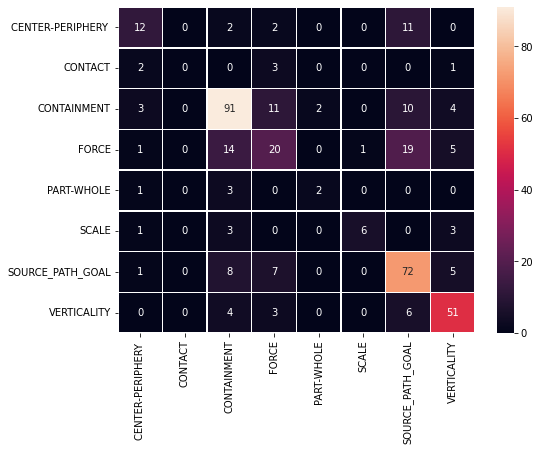

  Validation Loss All: 1.52


Training complete!
Total training took 0:05:48 (h:mm:ss)
max: 0.661318056756652
Length of trainset: 624
Starting Random Search

============== Iteration 1/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 4, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 624 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.88
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 2 / 12 ========

  Average training loss: 1.73
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.72

======== Epoch 3 / 12 ========

  Average training loss: 1.64
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.54

======== Epoch 4 / 12 ========

  Average training loss: 1.39
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.31

======== Epoch 5 / 12 ========

  Average training loss: 1.08
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.25

======== Epoch 6 / 12 ========

  Average training loss: 0.89
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.23

======== Epoch 7 / 12 ========

  Average training loss: 0.72
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.26

======== Epoch 8 / 12 ========

  Average training loss: 0.58
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.30

======== Epoch 9 / 12 ========

  Average training loss: 0.48
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.30

======== Epoch 10 / 12 ========

  Average training loss: 0.39
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.40

======== Epoch 11 / 12 ========

  Average training loss: 0.35
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.31

======== Epoch 12 / 12 ========

  Average training loss: 0.32
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


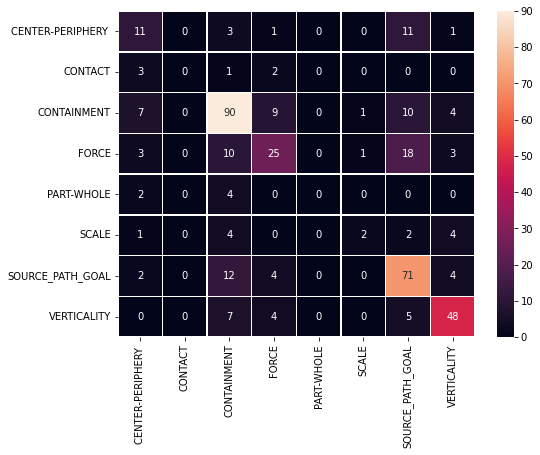

  Validation Loss All: 1.35


Training complete!
Total training took 0:04:51 (h:mm:ss)

============== Iteration 2/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 1, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 624 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.88
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.74

======== Epoch 2 / 12 ========

  Average training loss: 1.72
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.69

======== Epoch 3 / 12 ========

  Average training loss: 1.59
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.47

======== Epoch 4 / 12 ========

  Average training loss: 1.35
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.34

======== Epoch 5 / 12 ========

  Average training loss: 1.09
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.29

======== Epoch 6 / 12 ========

  Average training loss: 0.90
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.37

======== Epoch 7 / 12 ========

  Average training loss: 0.76
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.28

======== Epoch 8 / 12 ========

  Average training loss: 0.61
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.31

======== Epoch 9 / 12 ========

  Average training loss: 0.53
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.34

======== Epoch 10 / 12 ========

  Average training loss: 0.42
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.36

======== Epoch 11 / 12 ========

  Average training loss: 0.37
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.37

======== Epoch 12 / 12 ========

  Average training loss: 0.32
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


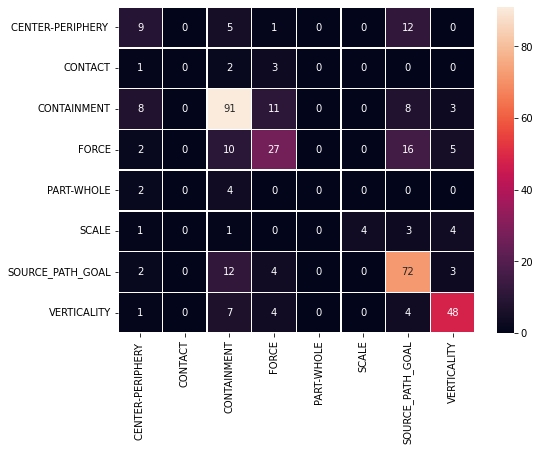

  Validation Loss All: 1.38


Training complete!
Total training took 0:04:51 (h:mm:ss)

============== Iteration 3/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 3, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 624 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.88
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.72

======== Epoch 2 / 12 ========

  Average training loss: 1.72
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 3 / 12 ========

  Average training loss: 1.63
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.65

======== Epoch 4 / 12 ========

  Average training loss: 1.45
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.48

======== Epoch 5 / 12 ========

  Average training loss: 1.24
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.42

======== Epoch 6 / 12 ========

  Average training loss: 1.02
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.38

======== Epoch 7 / 12 ========

  Average training loss: 0.86
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.41

======== Epoch 8 / 12 ========

  Average training loss: 0.71
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.40

======== Epoch 9 / 12 ========

  Average training loss: 0.60
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.39

======== Epoch 10 / 12 ========

  Average training loss: 0.50
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.45

======== Epoch 11 / 12 ========

  Average training loss: 0.42
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.52

======== Epoch 12 / 12 ========

  Average training loss: 0.39
  Training epoch took: 0:00:19
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


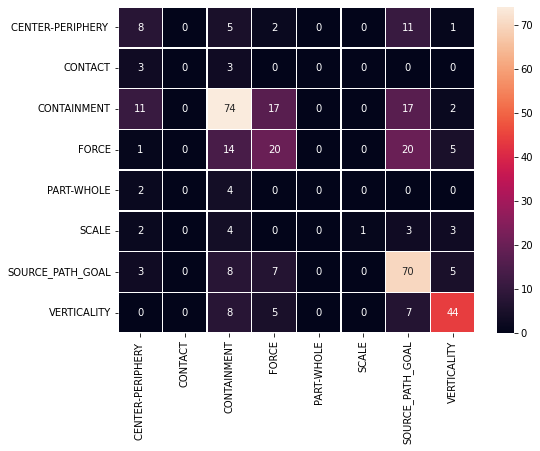

  Validation Loss All: 1.49


Training complete!
Total training took 0:04:51 (h:mm:ss)
max: 0.6270462826551646
Length of trainset: 468
Starting Random Search

============== Iteration 1/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 4, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 468 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.93
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.80

======== Epoch 2 / 12 ========

  Average training loss: 1.85
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.75

======== Epoch 3 / 12 ========

  Average training loss: 1.77
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 4 / 12 ========

  Average training loss: 1.71
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.64

======== Epoch 5 / 12 ========

  Average training loss: 1.57
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.56

======== Epoch 6 / 12 ========

  Average training loss: 1.35
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.48

======== Epoch 7 / 12 ========

  Average training loss: 1.15
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.46

======== Epoch 8 / 12 ========

  Average training loss: 0.99
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.40

======== Epoch 9 / 12 ========

  Average training loss: 0.86
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.40

======== Epoch 10 / 12 ========

  Average training loss: 0.80
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.42

======== Epoch 11 / 12 ========

  Average training loss: 0.68
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.43

======== Epoch 12 / 12 ========

  Average training loss: 0.63
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


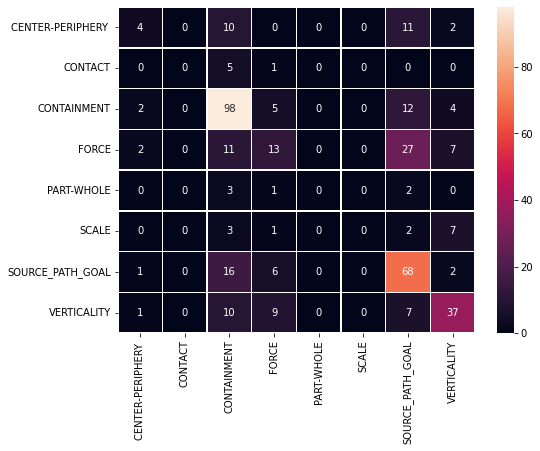

  Validation Loss All: 1.43


Training complete!
Total training took 0:03:57 (h:mm:ss)

============== Iteration 2/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 1, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 468 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.88
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 2 / 12 ========

  Average training loss: 1.78
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.69

======== Epoch 3 / 12 ========

  Average training loss: 1.73
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.67

======== Epoch 4 / 12 ========

  Average training loss: 1.58
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.50

======== Epoch 5 / 12 ========

  Average training loss: 1.31
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.42

======== Epoch 6 / 12 ========

  Average training loss: 1.18
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.34

======== Epoch 7 / 12 ========

  Average training loss: 0.97
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.32

======== Epoch 8 / 12 ========

  Average training loss: 0.86
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.34

======== Epoch 9 / 12 ========

  Average training loss: 0.77
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.37

======== Epoch 10 / 12 ========

  Average training loss: 0.66
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.42

======== Epoch 11 / 12 ========

  Average training loss: 0.60
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.42

======== Epoch 12 / 12 ========

  Average training loss: 0.55
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


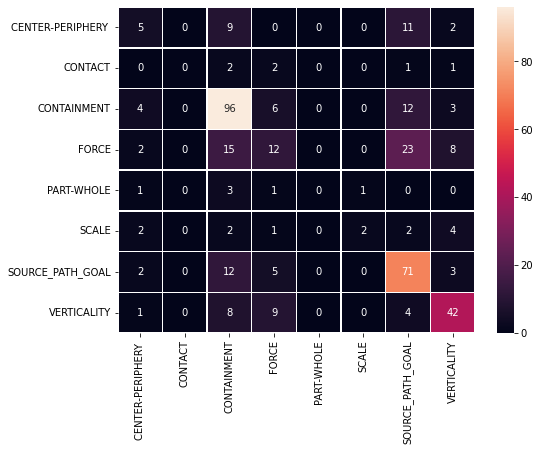

  Validation Loss All: 1.42


Training complete!
Total training took 0:03:57 (h:mm:ss)

============== Iteration 3/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 3, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 468 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.92
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.78

======== Epoch 2 / 12 ========

  Average training loss: 1.77
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.71

======== Epoch 3 / 12 ========

  Average training loss: 1.69
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.58

======== Epoch 4 / 12 ========

  Average training loss: 1.51
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.44

======== Epoch 5 / 12 ========

  Average training loss: 1.29
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.29

======== Epoch 6 / 12 ========

  Average training loss: 1.06
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.22

======== Epoch 7 / 12 ========

  Average training loss: 0.88
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.29

======== Epoch 8 / 12 ========

  Average training loss: 0.74
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.29

======== Epoch 9 / 12 ========

  Average training loss: 0.62
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.26

======== Epoch 10 / 12 ========

  Average training loss: 0.54
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.27

======== Epoch 11 / 12 ========

  Average training loss: 0.45
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.28

======== Epoch 12 / 12 ========

  Average training loss: 0.43
  Training epoch took: 0:00:14
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


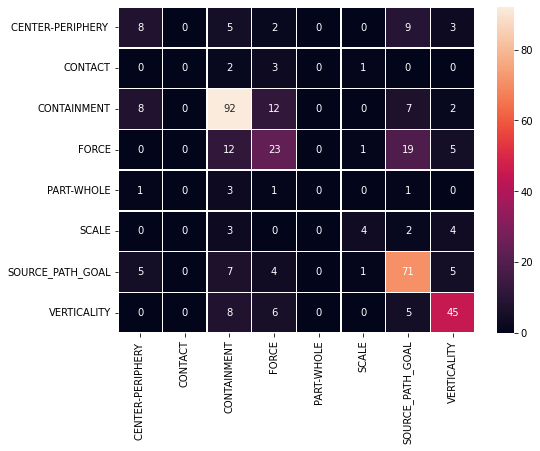

  Validation Loss All: 1.29


Training complete!
Total training took 0:03:57 (h:mm:ss)
max: 0.6043033149865449
Length of trainset: 312
Starting Random Search

============== Iteration 1/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 4, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 312 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.95
  Training epoch took: 0:00:10
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.82

======== Epoch 2 / 12 ========

  Average training loss: 1.77
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.72

======== Epoch 3 / 12 ========

  Average training loss: 1.68
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.69

======== Epoch 4 / 12 ========

  Average training loss: 1.64
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.60

======== Epoch 5 / 12 ========

  Average training loss: 1.51
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.52

======== Epoch 6 / 12 ========

  Average training loss: 1.33
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.47

======== Epoch 7 / 12 ========

  Average training loss: 1.15
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.39

======== Epoch 8 / 12 ========

  Average training loss: 1.04
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.37

======== Epoch 9 / 12 ========

  Average training loss: 0.98
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.41

======== Epoch 10 / 12 ========

  Average training loss: 0.85
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.43

======== Epoch 11 / 12 ========

  Average training loss: 0.79
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.43

======== Epoch 12 / 12 ========

  Average training loss: 0.75
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


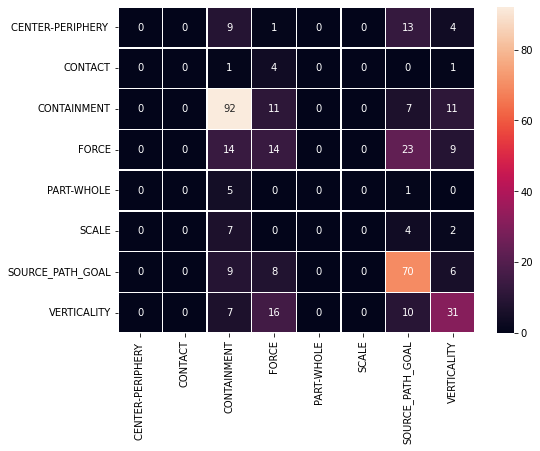

  Validation Loss All: 1.41


Training complete!
Total training took 0:03:00 (h:mm:ss)

============== Iteration 2/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 1, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 312 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.91
  Training epoch took: 0:00:10
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 2 / 12 ========

  Average training loss: 1.78
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 3 / 12 ========

  Average training loss: 1.74
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 4 / 12 ========

  Average training loss: 1.67
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.71

======== Epoch 5 / 12 ========

  Average training loss: 1.62
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.66

======== Epoch 6 / 12 ========

  Average training loss: 1.57
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.60

======== Epoch 7 / 12 ========

  Average training loss: 1.42
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.53

======== Epoch 8 / 12 ========

  Average training loss: 1.27
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.50

======== Epoch 9 / 12 ========

  Average training loss: 1.19
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.47

======== Epoch 10 / 12 ========

  Average training loss: 1.08
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.45

======== Epoch 11 / 12 ========

  Average training loss: 1.02
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.45

======== Epoch 12 / 12 ========

  Average training loss: 1.01
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


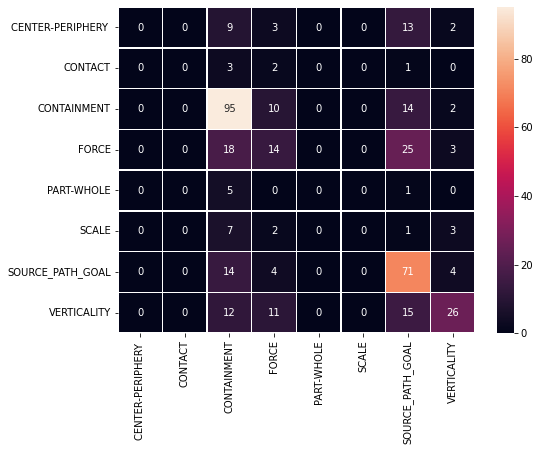

  Validation Loss All: 1.44


Training complete!
Total training took 0:03:00 (h:mm:ss)

============== Iteration 3/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 3, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 312 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 2.00
  Training epoch took: 0:00:10
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.76

======== Epoch 2 / 12 ========

  Average training loss: 1.73
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.71

======== Epoch 3 / 12 ========

  Average training loss: 1.69
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.70

======== Epoch 4 / 12 ========

  Average training loss: 1.63
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.66

======== Epoch 5 / 12 ========

  Average training loss: 1.52
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.64

======== Epoch 6 / 12 ========

  Average training loss: 1.37
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.52

======== Epoch 7 / 12 ========

  Average training loss: 1.18
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.48

======== Epoch 8 / 12 ========

  Average training loss: 1.05
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.58

======== Epoch 9 / 12 ========

  Average training loss: 0.90
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.51

======== Epoch 10 / 12 ========

  Average training loss: 0.82
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.48

======== Epoch 11 / 12 ========

  Average training loss: 0.76
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.50

======== Epoch 12 / 12 ========

  Average training loss: 0.74
  Training epoch took: 0:00:09
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


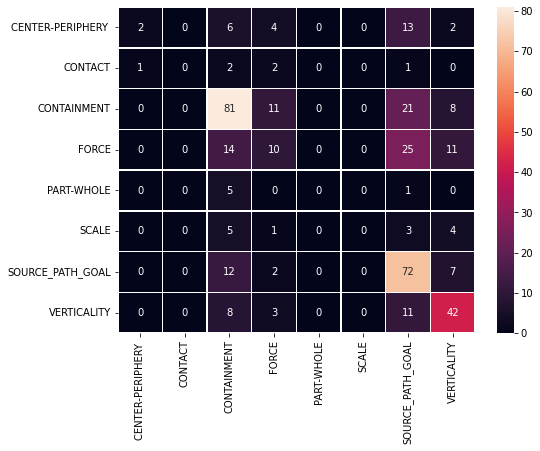

  Validation Loss All: 1.49


Training complete!
Total training took 0:03:00 (h:mm:ss)
max: 0.48375888101078734
Length of trainset: 156
Starting Random Search

============== Iteration 1/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 4, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 156 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 2.01
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.88

======== Epoch 2 / 12 ========

  Average training loss: 1.81
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.76

======== Epoch 3 / 12 ========

  Average training loss: 1.70
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 4 / 12 ========

  Average training loss: 1.68
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.71

======== Epoch 5 / 12 ========

  Average training loss: 1.62
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.68

======== Epoch 6 / 12 ========

  Average training loss: 1.55
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.64

======== Epoch 7 / 12 ========

  Average training loss: 1.49
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.61

======== Epoch 8 / 12 ========

  Average training loss: 1.40
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.58

======== Epoch 9 / 12 ========

  Average training loss: 1.35
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.57

======== Epoch 10 / 12 ========

  Average training loss: 1.22
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.56

======== Epoch 11 / 12 ========

  Average training loss: 1.20
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.55

======== Epoch 12 / 12 ========

  Average training loss: 1.15
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


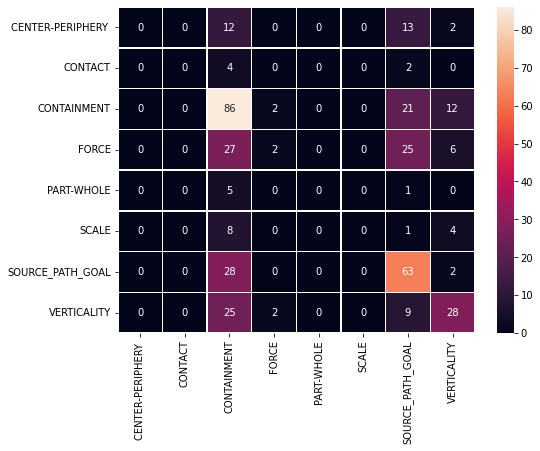

  Validation Loss All: 1.54


Training complete!
Total training took 0:02:03 (h:mm:ss)

============== Iteration 2/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 1, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 156 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 1.99
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.89

======== Epoch 2 / 12 ========

  Average training loss: 1.86
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.82

======== Epoch 3 / 12 ========

  Average training loss: 1.76
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.76

======== Epoch 4 / 12 ========

  Average training loss: 1.70
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.75

======== Epoch 5 / 12 ========

  Average training loss: 1.72
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.74

======== Epoch 6 / 12 ========

  Average training loss: 1.62
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.70

======== Epoch 7 / 12 ========

  Average training loss: 1.57
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.68

======== Epoch 8 / 12 ========

  Average training loss: 1.49
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.67

======== Epoch 9 / 12 ========

  Average training loss: 1.51
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.64

======== Epoch 10 / 12 ========

  Average training loss: 1.42
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.61

======== Epoch 11 / 12 ========

  Average training loss: 1.44
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.60

======== Epoch 12 / 12 ========

  Average training loss: 1.39
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


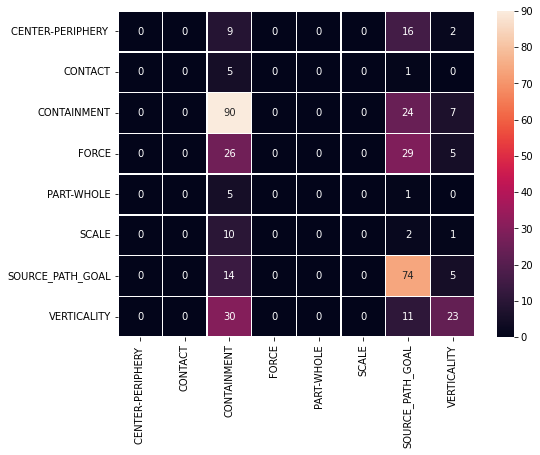

  Validation Loss All: 1.59


Training complete!
Total training took 0:02:03 (h:mm:ss)

============== Iteration 3/3 ==============

{'weight_decay': 0, 'warmup_steps': 0, 'random_seed': 3, 'model_name': 'xlm-roberta-base', 'max_len': 64, 'lr': 3e-05, 'eps': 1e-08, 'epochs': 12, 'batch_size': 16}
Encoder finished. 156 examples.
num labels 8


Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense

Connected to GPU: Tesla K80
================ Model Training ================

======== Epoch 1 / 12 ========


/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,



  Average training loss: 2.06
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.99

======== Epoch 2 / 12 ========

  Average training loss: 1.91
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.82

======== Epoch 3 / 12 ========

  Average training loss: 1.83
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.86

======== Epoch 4 / 12 ========

  Average training loss: 1.80
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.76

======== Epoch 5 / 12 ========

  Average training loss: 1.75
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.81

======== Epoch 6 / 12 ========

  Average training loss: 1.69
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 7 / 12 ========

  Average training loss: 1.69
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.73

======== Epoch 8 / 12 ========

  Average training loss: 1.67
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.71

======== Epoch 9 / 12 ========

  Average training loss: 1.66
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.71

======== Epoch 10 / 12 ========

  Average training loss: 1.63
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.70

======== Epoch 11 / 12 ========

  Average training loss: 1.61
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


  Validation Loss All: 1.70

======== Epoch 12 / 12 ========

  Average training loss: 1.61
  Training epoch took: 0:00:05
evaluate


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


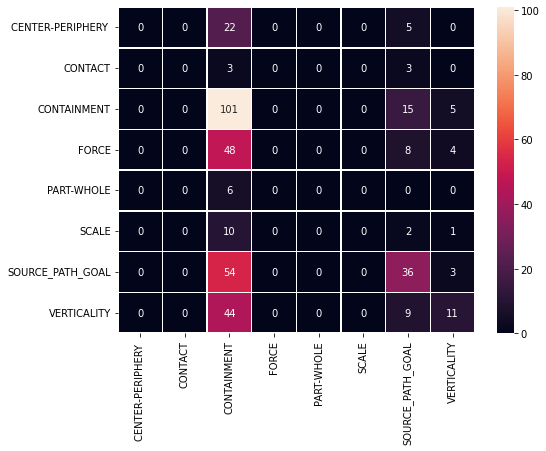

  Validation Loss All: 1.69


Training complete!
Total training took 0:02:03 (h:mm:ss)
max: 0.39130445280556925


In [40]:
learning_curve_data_x=[]
learning_curve_data_y_long=[]
learning_curve_data_y=[]
for train_set in train_sets:
  print("Length of trainset:", len(train_set))
  results = randomsearch(param_list, train_set)
  max=0
  for r in results:
    if r[3]>max: 
      max=r[3]
  print("max:",max)
  sum=0
  scores=[]
  for r in results:
    sum+=r[3]
    scores.append(r[3])
  avg=sum/len(results)
  learning_curve_data_x.append(len(train_set))
  learning_curve_data_y.append(avg)
  learning_curve_data_y_long.append(scores)

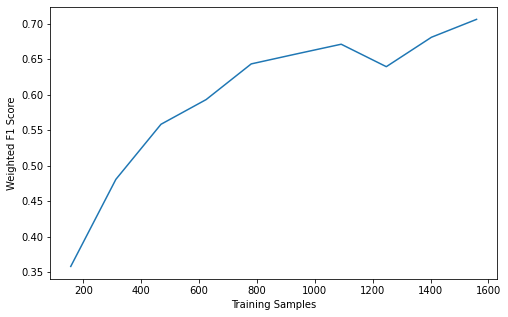

In [41]:
plt.figure(figsize=(8,5))
plt.plot(learning_curve_data_x, learning_curve_data_y)
plt.ylabel('Weighted F1 Score')
plt.xlabel('Training Samples')
plt.show()

In [42]:
df_for_learning_curve=df.from_records(learning_curve_data_y_long)
df_for_learning_curve['Training Samples'] = learning_curve_data_x
df_for_learning_curve

,0,1,2,Training Samples
0,0.713367,0.699529,0.705191,1559
1,0.679914,0.663833,0.698690,1403
2,0.695702,0.546257,0.676141,1247
3,0.648211,0.685413,0.679353,1091
4,0.658895,0.650876,0.661858,935
5,0.661318,0.631544,0.636958,780
6,0.614235,0.627046,0.537688,624
7,0.520980,0.549387,0.604303,468
8,0.483759,0.474963,0.483161,312
9,0.387858,0.391304,0.294662,156


In [43]:
samples=list(df_for_learning_curve['Training Samples'])*3
zipped = list(zip(samples, list(df_for_learning_curve[0])+list(df_for_learning_curve[1])+list(df_for_learning_curve[2])))
df = pd.DataFrame(zipped, columns=['Training Samples', 'Weighted F1 Score'])
#df

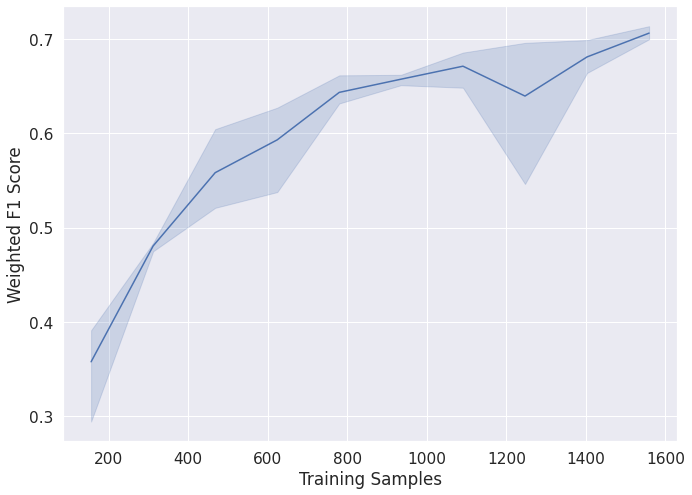

In [45]:
plt.figure(figsize=(11,8))
sns.set(font_scale=1.4)
sns.lineplot(data=df, x="Training Samples", y="Weighted F1 Score")
plt.savefig("learning-curve.png")